In [1]:
import sys
import os
import re
import itertools
import logging
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.preprocessing import OneHotEncoder
from scipy.sparse.csr import csr_matrix

from tqdm.auto import trange
from collections import Counter, defaultdict
from scipy.sparse import hstack
import pickle
from torch.utils.data import Dataset
from glob import glob
from IPython.display import display as ipython_displpay
from IPython.display import HTML
# from imblearn.over_sampling import RandomOverSampler

In [2]:
import pandas as pd
import numpy as np

In [3]:
import requests

In [4]:
import json

In [5]:
WORKING_DIR = re.sub('jdi-qasp-ml.*$','',os.path.normpath(os.getcwd())) + 'jdi-qasp-ml' + '\\MUI_model'
os.chdir(WORKING_DIR)

In [6]:
WORKING_DIR

'C:\\WORK\\jdi-qasp-ml\\MUI_model'

In [7]:
UTILS_LOGGER = 'utils.dataset'
LOG_FILE_PATH = 'tmp/log.txt'

os.makedirs(name='tmp', exist_ok=True)

logger = logging.getLogger(UTILS_LOGGER)
logger.setLevel(logging.DEBUG)


formatter = logging.Formatter('%(asctime)s -%(levelname)s - %(module)s:%(filename)s:%(lineno)d - %(message)s')

console_handler = logging.StreamHandler(sys.stdout)
console_handler.setFormatter(formatter)

file_handler = logging.FileHandler(filename=LOG_FILE_PATH, mode='w')
file_handler.setFormatter(formatter)

logger.addHandler(console_handler)
logger.addHandler(file_handler)

logger.info('Module utils.config was loaded')

2021-08-27 14:29:49,233 -INFO - 632196539:632196539.py:21 - Module utils.config was loaded


In [8]:
os.listdir()

['.gitignore',
 '.ipynb_checkpoints',
 'dataset',
 'model',
 'notebooks',
 'tmp',
 'train.py',
 'utils',
 '__init__.py',
 '__pycache__']

In [8]:
import seaborn as sns

In [9]:
from utils.dataset_builder import DatasetBuilder

ModuleNotFoundError: No module named 'utils.dataset_builder'

In [ ]:
from time import sleep

In [10]:
import matplotlib.pyplot as plt
%matplotlib inline

In [12]:
SITE_URL = 'file:///C:/WORK/jdi-qasp-ml/MUI_model/dataset/site1/index.html'

In [13]:
DATASET_NAME = 'mui-site1'

In [14]:
WAIT_TIME_SECONDS = 7

In [15]:
def collect_many_ds(SITE_URLS, DATASET_NAMES):
    for site, ds_name in zip(SITE_URLS, DATASET_NAMES):
        class JDIDatasetBuilder(DatasetBuilder):

            def setUp(self, driver):
                self.logger.info(f'getting page')
                driver.get(site)

                driver.set_window_size(width=1500, height=4000)

                sleep(WAIT_TIME_SECONDS)
        with JDIDatasetBuilder(url=site, dataset_name=ds_name, headless=True) as builder:
            elements_df = builder.dataset
            dataset_json = builder.dataset_json
            elements_df['idx'] = elements_df.index
            elements_df['ds_name'] = ds_name
            plt.imshow(plt.imread(f'dataset/images/{ds_name}.png'))
            if ds_name == 'mui-site1':
                df_json_10sites = elements_df
            else:
                df_json_10sites = pd.concat([df_json_10sites, elements_df], axis=0)
    return df_json_10sites

2021-08-18 18:12:04,597 -INFO - dataset_builder:dataset_builder.py:78 - Dataset name: mui-site1
2021-08-18 18:12:04,600 -INFO - dataset_builder:dataset_builder.py:87 - Create directories to save the dataset
2021-08-18 18:12:04,605 -INFO - dataset_builder:dataset_builder.py:125 - Creating driver
2021-08-18 18:12:05,740 -INFO - dataset_builder:dataset_builder.py:136 - Chrome web driver is created
2021-08-18 18:12:05,742 -INFO - 2840427130:2840427130.py:4 - getting page
2021-08-18 18:12:13,277 -INFO - dataset_builder:dataset_builder.py:139 - save scrinshot: dataset/images/mui-site1.png
2021-08-18 18:12:14,254 -INFO - dataset_builder:dataset_builder.py:183 - Collect features using JS script
2021-08-18 18:12:17,853 -INFO - dataset_builder:dataset_builder.py:191 - Save html to dataset/html/mui-site1.html
2021-08-18 18:12:17,930 -INFO - dataset_builder:dataset_builder.py:201 - Save parquet to dataset/df/mui-site1.parquet
2021-08-18 18:12:17,950 -INFO - dataset_builder:dataset_builder.py:203 -

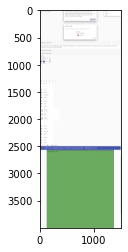

In [26]:
class JDIDatasetBuilder(DatasetBuilder):

    def setUp(self, driver):
        self.logger.info(f'getting page')
        driver.get(SITE_URL)
        #driver.set_window_size(width=1920, height=8400)
        driver.set_window_size(width=1500, height=4000)
        
#         driver.find_element_by_id("user-icon").click()
#         driver.find_element_by_id("name").send_keys(LOGIN)
#         driver.find_element_by_id("password").send_keys(PASSWORD)
#         driver.find_element_by_id("login-button").click()
        sleep(WAIT_TIME_SECONDS)
        
#         driver.find_element_by_link_text("Service").click()
#         driver.find_element_by_link_text("Complex Table").click()
#         maximize_window(driver=driver)
        
with JDIDatasetBuilder(url=SITE_URL, dataset_name=DATASET_NAME, headless=True) as builder:
    elements_df = builder.dataset
    dataset_json = builder.dataset_json
    plt.imshow(plt.imread(f'dataset/images/{DATASET_NAME}.png'))
    
    
# builder = JDIDatasetBuilder(url=SITE_URL, dataset_name=DATASET_NAME, headless=True)
# elements_df = builder.dataset
# plt.imshow(plt.imread(f'dataset/images/{DATASET_NAME}.png'))

In [127]:
elements_df['idx'] = elements_df.index

In [129]:
elements_df.head()

,attributes,displayed,element_id,height,onmouseenter,onmouseover,parent_id,style,tag_name,text,width,x,y,idx
0,{'lang': 'en'},False,0058456568209432109074850291,15091.265625,None,None,None,"[align-content, align-items, align-self, align...",HTML,Recents\nFavorites\nNearby\nInbox\nStarred\nSe...,1474.0,0.0,-10159.0,0
1,None,False,9088809497209432108684658849,0.000000,None,None,0058456568209432109074850291,"[align-content, align-items, align-self, align...",HEAD,React App\n.MuiSvgIcon-root {\n fill: current...,0.0,0.0,0.0,1
2,{'charset': 'utf-8'},False,6972712895209432108140514775,0.000000,None,None,9088809497209432108684658849,"[align-content, align-items, align-self, align...",META,,0.0,0.0,0.0,2
3,"{'href': './favicon.ico', 'rel': 'icon'}",False,9689268595209432100343414697,0.000000,None,None,9088809497209432108684658849,"[align-content, align-items, align-self, align...",LINK,,0.0,0.0,0.0,3
4,"{'content': 'width=device-width,initial-scale=...",False,1222422046209432103005093761,0.000000,None,None,9088809497209432108684658849,"[align-content, align-items, align-self, align...",META,,0.0,0.0,0.0,4


In [14]:
dataset_json


[{'attributes': {'lang': 'en'},
  'displayed': False,
  'element_id': '2813167923145770567340391031',
  'height': 15091.265625,
  'onmouseenter': None,
  'onmouseover': None,
  'parent_id': None,
  'style': ['align-content',
   'align-items',
   'align-self',
   'alignment-baseline',
   'animation-delay',
   'animation-direction',
   'animation-duration',
   'animation-fill-mode',
   'animation-iteration-count',
   'animation-name',
   'animation-play-state',
   'animation-timing-function',
   'appearance',
   'backdrop-filter',
   'backface-visibility',
   'background-attachment',
   'background-blend-mode',
   'background-clip',
   'background-color',
   'background-image',
   'background-origin',
   'background-position',
   'background-repeat',
   'background-size',
   'baseline-shift',
   'block-size',
   'border-block-end-color',
   'border-block-end-style',
   'border-block-end-width',
   'border-block-start-color',
   'border-block-start-style',
   'border-block-start-width',
 

#### Try to send to predictions with current model

In [116]:
PREDICT_URL = 'http://localhost:5000/predict'

In [120]:
%%time

response = requests.post(
    PREDICT_URL, data=json.dumps(dataset_json)
)

if response.status_code == 200:
    display(json.loads(response.text))
else:
    raise Exception(response.text)

[{'element_id': '9913961414036765326933464784',
  'x': 1.0,
  'y': 4876.265625,
  'width': 1472.0,
  'height': 56.0,
  'predicted_label': 'button',
  'predicted_probability': 0.8926693797,
  'sort_key': 82432.0},
 {'element_id': '3609192656036765326125856862',
  'x': 1.0,
  'y': 4820.265625,
  'width': 1472.0,
  'height': 56.0,
  'predicted_label': 'button',
  'predicted_probability': 0.8926693797,
  'sort_key': 82432.0},
 {'element_id': '9925502576036765322565025596',
  'x': 1.0,
  'y': 711.265625,
  'width': 1472.0,
  'height': 56.0,
  'predicted_label': 'button',
  'predicted_probability': 0.8926693797,
  'sort_key': 82432.0},
 {'element_id': '7047440833036765321351218533',
  'x': 1.0,
  'y': 767.265625,
  'width': 1472.0,
  'height': 56.0,
  'predicted_label': 'button',
  'predicted_probability': 0.8926693797,
  'sort_key': 82432.0},
 {'element_id': '9151102831036765316911316265',
  'x': 0.0,
  'y': -8168.0,
  'width': 1474.0,
  'height': 48.0,
  'predicted_label': 'button',
  'pre

Wall time: 4.31 s


In [126]:
from utils import load_gray_image
from matplotlib.patches import Rectangle

In [127]:
df = pd.read_parquet(f'dataset/df/{DATASET_NAME}.parquet')[['element_id', 'tag_name']]
predictions_df = pd.DataFrame(json.loads(response.text)).merge(df, on='element_id')

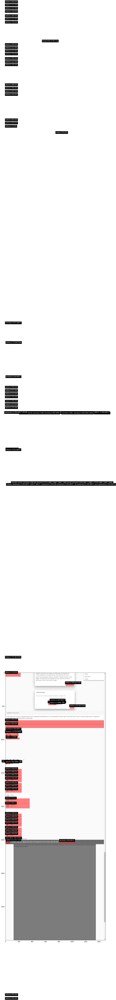

In [128]:
img = load_gray_image(f'dataset/images/{DATASET_NAME}.png')
plt.figure(figsize=(13,300))
plt.imshow(img, cmap='gray')

axes = plt.gca()

for _, r in predictions_df.iterrows():
    patch = Rectangle((r.x, r.y), r.width, r.height, alpha=.5, color='red')
    axes.add_patch(patch)
    
    axes.text(r.x, r.y, 
              r.predicted_label + ':' +str(round(r.predicted_probability, 3)) + ':' + r.tag_name, 
              backgroundcolor='black', 
              color='white')

#### add label

In [15]:
elements_df.attributes.apply(lambda x: x.get('data-label') if x is not None else 'n/a').fillna('n/a')

0              n/a
1              n/a
2              n/a
3              n/a
4              n/a
           ...    
1431           n/a
1432    typography
1433           n/a
1434        popper
1435           n/a
Name: attributes, Length: 1436, dtype: object

In [16]:
elements_df['label'] = elements_df.attributes.apply(lambda x: x.get('data-label') if x is not None else 'n/a').fillna('n/a')

In [17]:
elements_df[elements_df['label'] != 'n/a'].head(50).T

,124,127,133,139,145,148,149,152,159,166,...,312,318,358,361,364,373,376,379,388,391
attributes,"{'class': 'MuiBottomNavigation-root jss1', 'da...","{'aria-hidden': 'true', 'class': 'MuiSvgIcon-r...","{'aria-hidden': 'true', 'class': 'MuiSvgIcon-r...","{'aria-hidden': 'true', 'class': 'MuiSvgIcon-r...",{'class': 'MuiDrawer-root MuiDrawer-docked jss...,"{'class': 'MuiDivider-root', 'data-label': 'di...","{'class': 'MuiList-root MuiList-padding', 'dat...","{'aria-hidden': 'true', 'class': 'MuiSvgIcon-r...","{'aria-hidden': 'true', 'class': 'MuiSvgIcon-r...","{'aria-hidden': 'true', 'class': 'MuiSvgIcon-r...",...,"{'class': 'MuiDivider-root MuiDivider-light', ...","{'aria-label': 'customized table', 'class': 'M...",{'class': 'MuiPaper-root MuiAccordion-root Mui...,{'class': 'MuiTypography-root jss20 MuiTypogra...,"{'aria-hidden': 'true', 'class': 'MuiSvgIcon-r...",{'class': 'MuiPaper-root MuiAccordion-root Mui...,{'class': 'MuiTypography-root jss20 MuiTypogra...,"{'aria-hidden': 'true', 'class': 'MuiSvgIcon-r...",{'class': 'MuiPaper-root MuiAccordion-root Mui...,{'class': 'MuiTypography-root jss20 MuiTypogra...
displayed,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
element_id,8259705029145770565422351920,6497246615145770567245391681,4236516484145770563576784166,9868670917145770562218524672,7936874712145770563389118446,4338249899145770568667517809,0963041383145770565797397276,9758639580145770566672522345,7121300257145770571381858355,4485845316145770577936354867,...,5147120034145770577657276481,4718353085145770577919780757,7911998520145770577721795414,2018177542145770570920875358,4375483787145770578920147208,2317047543145770577084257242,0709440982145770575024026032,3566651390145770573715990921,8707304338145770580130059182,3721069278145770580729268470
height,56.0,24.0,24.0,24.0,434.0,1.0,208.0,24.0,24.0,24.0,...,1.0,322.0,48.0,22.0,24.0,48.0,22.0,24.0,48.0,22.0
onmouseenter,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
onmouseover,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
parent_id,2120712099145770561325284175,0279051199145770564982600843,7739027454145770561917628195,4658704365145770566469758944,8465757585145770560062300899,0478753529145770567203221185,0478753529145770567203221185,9409030522145770562411786765,2279800202145770572523134104,9983514107145770572803859771,...,0645655759145770571234277631,1412352871145770571770624610,8408396659145770574598122483,1788590167145770570987242303,8832064933145770572755319691,8408396659145770574598122483,7712961293145770579277503184,2934296911145770570996642067,8408396659145770574598122483,5595218659145770589632324510
style,"[align-content, align-items, align-self, align...","[align-content, align-items, align-self, align...","[align-content, align-items, align-self, align...","[align-content, align-items, align-self, align...","[align-content, align-items, align-self, align...","[align-content, align-items, align-self, align...","[align-content, align-items, align-self, align...","[align-content, align-items, align-self, align...","[align-content, align-items, align-self, align...","[align-content, align-items, align-self, align...",...,"[align-content, align-items, align-self, align...","[align-content, align-items, align-self, align...","[align-content, align-items, align-self, align...","[align-content, align-items, align-self, align...","[align-content, align-items, align-self, align...","[align-content, align-items, align-self, align...","[align-content, align-items, align-self, align...","[align-content, align-items, align-self, align...","[align-content, align-items, align-self, align...","[align-content, align-items, align-self, align..."
tag_name,DIV,svg,svg,svg,DIV,HR,UL,svg,svg,svg,...,HR,TABLE,DIV,P,svg,DIV,P,svg,DIV,P
text,Recents\nFavorites\nNearby,None,None,None,Inbox\nStarred\nSend em

### EDA

#### Tag_name

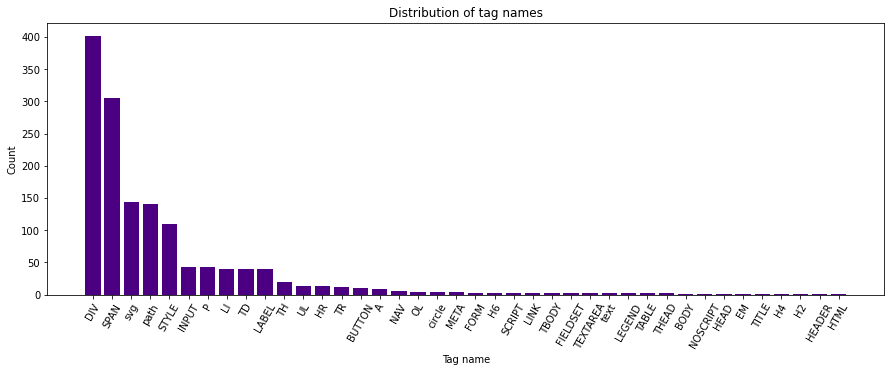

In [18]:
def plot_tag_names(df, col):
    plt.figure(figsize=(15,5))
    plt.bar(df[col].value_counts().index, height=df[col].value_counts().values, color='indigo')
    plt.title('Distribution of tag names')
    plt.xlabel('Tag name')
    plt.ylabel('Count')
    plt.xticks(rotation=60);
plot_tag_names(elements_df, 'tag_name')

#### Label

In [19]:
len(elements_df['label'][elements_df['label'] != 'n/a'])

231

In [20]:
len(elements_df['label'][elements_df['label'] == 'n/a'])

1205

In [21]:
len(elements_df['label'][elements_df['label'] != 'n/a'])/len(elements_df['label'][elements_df['label'] == 'n/a'])

0.19170124481327802

In [114]:
def plot_labels(df, col):
    plt.figure(figsize=(15,5))
    plt.bar(df[col][df[col] != 'n/a'].value_counts().index, height=df[col][df[col] != 'n/a'].value_counts().values, color='skyblue')
    plt.title('Distribution of labels without n/a')
    plt.xlabel('Label')
    plt.ylabel('Count')
    plt.xticks(rotation=60);
# plot_labels(elements_df, 'label')

#### Explore other attributes

In [115]:
def plot_attr_names(df, col):
    attr_names = df[col].apply(lambda x: list(x.keys()) if x is not None else ['n/a'])
    attr_names = list(itertools.chain.from_iterable(attr_names.to_list()))
    plt.figure(figsize=(15,5))
    plt.bar(pd.Series(attr_names).value_counts().index, height=pd.Series(attr_names).value_counts().values, color='olivedrab')
    plt.title('Distribution of attribute names')
    plt.xlabel('Name')
    plt.ylabel('Count')
    plt.xticks(rotation=80);
# plot_attr_names(elements_df, 'attributes')

In [24]:
attr_names = elements_df['attributes'].apply(lambda x: list(x.keys()) if x is not None else ['n/a'])
attr_names = list(itertools.chain.from_iterable(attr_names.to_list()))

In [25]:
pd.Series(attr_names).value_counts()['class']/len(elements_df) #77% of elements have a class attribute

0.7778551532033426

In [116]:
def plot_class_names(df, col, attribute, thresh = 5, color = 'crimson'):
    class_values = df[col].apply(lambda x: x.get(attribute) if x is not None else 'n/a').fillna('n/a')
    classes = pd.DataFrame({'name':class_values.value_counts().index, 'value':class_values.value_counts().values})
    classes = classes[classes['name'] != 'n/a']
    plt.figure(figsize=(15,5))
    plt.bar(classes['name'][classes['value']>thresh], classes['value'][classes['value']>thresh].astype('int'), color=color)
    plt.title(f'Distribution of {attribute} names')
    plt.xlabel(f'{attribute} name')
    plt.ylabel('Count')
    plt.xticks(rotation='vertical');
# plot_class_names(elements_df, 'attributes', 'class')

### Construct dataset out of 10 test pages

In [16]:
n_datasets = 10
SITE_URLS = [f'file:///C:/WORK/jdi-qasp-ml/MUI_model/dataset/site{i}/index.html' for i in range (1,n_datasets)]
DATASET_NAMES = [f'mui-site{i}' for i in range (1,n_datasets)]

2021-08-16 14:50:00,884 -INFO - dataset_builder:dataset_builder.py:77 - Dataset name: mui-site1
2021-08-16 14:50:00,884 -INFO - dataset_builder:dataset_builder.py:86 - Create directories to save the dataset
2021-08-16 14:50:00,894 -INFO - dataset_builder:dataset_builder.py:123 - Creating driver
2021-08-16 14:50:02,006 -INFO - dataset_builder:dataset_builder.py:131 - Chrome web driver is created
2021-08-16 14:50:02,006 -INFO - 2224051056:2224051056.py:5 - getting page
2021-08-16 14:50:09,548 -INFO - dataset_builder:dataset_builder.py:134 - save scrinshot: dataset/images/mui-site1.png
2021-08-16 14:50:10,623 -INFO - dataset_builder:dataset_builder.py:178 - Collect features using JS script
2021-08-16 14:50:14,465 -INFO - dataset_builder:dataset_builder.py:186 - Save html to dataset/html/mui-site1.html
2021-08-16 14:50:14,528 -INFO - dataset_builder:dataset_builder.py:196 - Save parquet to dataset/df/mui-site1.parquet
2021-08-16 14:50:14,541 -INFO - dataset_builder:dataset_builder.py:198 -

2021-08-16 14:51:41,208 -INFO - 2224051056:2224051056.py:5 - getting page
2021-08-16 14:51:48,735 -INFO - dataset_builder:dataset_builder.py:134 - save scrinshot: dataset/images/mui-site8.png
2021-08-16 14:51:49,807 -INFO - dataset_builder:dataset_builder.py:178 - Collect features using JS script
2021-08-16 14:51:52,988 -INFO - dataset_builder:dataset_builder.py:186 - Save html to dataset/html/mui-site8.html
2021-08-16 14:51:53,058 -INFO - dataset_builder:dataset_builder.py:196 - Save parquet to dataset/df/mui-site8.parquet
2021-08-16 14:51:53,058 -INFO - dataset_builder:dataset_builder.py:198 - No attributes: (20, 13)
2021-08-16 14:51:53,606 -INFO - dataset_builder:dataset_builder.py:101 - Close web driver
2021-08-16 14:51:53,697 -INFO - dataset_builder:dataset_builder.py:77 - Dataset name: mui-site9
2021-08-16 14:51:53,697 -INFO - dataset_builder:dataset_builder.py:86 - Create directories to save the dataset
2021-08-16 14:51:53,703 -INFO - dataset_builder:dataset_builder.py:123 - Cre

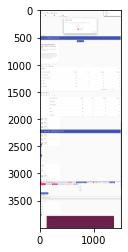

In [29]:
for site, ds_name in zip(SITE_URLS, DATASET_NAMES):
    class JDIDatasetBuilder(DatasetBuilder):

        def setUp(self, driver):
            self.logger.info(f'getting page')
            driver.get(site)

            driver.set_window_size(width=1500, height=4000)

            sleep(WAIT_TIME_SECONDS)
    with JDIDatasetBuilder(url=site, dataset_name=ds_name, headless=True) as builder:
        elements_df = builder.dataset
        dataset_json = builder.dataset_json
        elements_df['idx'] = elements_df.index
        plt.imshow(plt.imread(f'dataset/images/{ds_name}.png'))
        if ds_name == 'mui-site1':
            df_json_10sites = elements_df
        else:
            df_json_10sites = pd.concat([df_json_10sites, elements_df], axis=0)

In [30]:
df_json_10sites.head()

,attributes,displayed,element_id,height,onmouseenter,onmouseover,parent_id,style,tag_name,text,width,x,y
0,{'lang': 'en'},False,7428607671146106373471443401,15091.265625,None,None,None,"[align-content, align-items, align-self, align...",HTML,Recents\nFavorites\nNearby\nInbox\nStarred\nSe...,1474.0,0.0,-10159.0
1,None,False,6485148970146106380013741247,0.000000,None,None,7428607671146106373471443401,"[align-content, align-items, align-self, align...",HEAD,React App\n.MuiSvgIcon-root {\n fill: current...,0.0,0.0,0.0
2,{'charset': 'utf-8'},False,0887150396146106382039204998,0.000000,None,None,6485148970146106380013741247,"[align-content, align-items, align-self, align...",META,,0.0,0.0,0.0
3,"{'href': './favicon.ico', 'rel': 'icon'}",False,4394456534146106385148249601,0.000000,None,None,6485148970146106380013741247,"[align-content, align-items, align-self, align...",LINK,,0.0,0.0,0.0
4,"{'content': 'width=device-width,initial-scale=...",False,2863660729146106386812295191,0.000000,None,None,6485148970146106380013741247,"[align-content, align-items, align-self, align...",META,,0.0,0.0,0.0


In [31]:
df_json_10sites['label'] = df_json_10sites.attributes.apply(lambda x: x.get('data-label') if x is not None else 'n/a').fillna('n/a')

In [76]:
df_json_10sites['bin_label'] = df_json_10sites.label.apply(lambda x: 0 if x == 'n/a' else 1)

In [77]:
df_json_10sites
df_json_10sites['idx'] = df_json_10sites.index

,attributes,displayed,element_id,height,onmouseenter,onmouseover,parent_id,style,tag_name,text,width,x,y,label,bin_label,class
0,{'lang': 'en'},False,7428607671146106373471443401,15091.265625,None,None,None,"[align-content, align-items, align-self, align...",HTML,Recents\nFavorites\nNearby\nInbox\nStarred\nSe...,1474.000000,0.0,-10159.0,n/a,0,
1,None,False,6485148970146106380013741247,0.000000,None,None,7428607671146106373471443401,"[align-content, align-items, align-self, align...",HEAD,React App\n.MuiSvgIcon-root {\n fill: current...,0.000000,0.0,0.0,n/a,0,
2,{'charset': 'utf-8'},False,0887150396146106382039204998,0.000000,None,None,6485148970146106380013741247,"[align-content, align-items, align-self, align...",META,,0.000000,0.0,0.0,n/a,0,
3,"{'href': './favicon.ico', 'rel': 'icon'}",False,4394456534146106385148249601,0.000000,None,None,6485148970146106380013741247,"[align-content, align-items, align-self, align...",LINK,,0.000000,0.0,0.0,n/a,0,
4,"{'content': 'width=device-width,initial-scale=...",False,2863660729146106386812295191,0.000000,None,None,6485148970146106380013741247,"[align-content, align-items, align-self, align...",META,,0.000000,0.0,0.0,n/a,0,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1357,"{'aria-hidden': 'true', 'style': 'z-index: -1;...",True,4762097280147377638155937072,4000.000000,None,None,5567255542147377632992072663,"[align-content, align-items, align-self, align...",DIV,,1474.000000,0.0,0.0,n/a,0,
1358,"{'data-test': 'sentinelStart', 'tabindex': '0'}",False,1424188079147377633196832711,0.000000,None,None,5567255542147377632992072663,"[align-content, align-items, align-self, align...",DIV,,1474.000000,0.0,-6588.0,n/a,0,
1359,{'class': 'MuiPaper-root MuiPopover-paper jss8...,False,8547482115147377630989995684,40.000000,None,None,5567255542147377632992072663,"[align-content, align-items, align-self, align...",DIV,I use Popover.,120.390625,16.0,-2644.0,n/a,0,MuiPaper-root MuiPopover-paper jss85 MuiPaper-...
1360,{'class': 'MuiTypography-root MuiTypography-bo...,False,1310916999147377639427216991,24.000000,None,None,8547482115147377630989995684,"[align-content, align-items, align-self, align...",P,I use Popover.,104.390625,24.0,-2636.0,n/a,0,MuiTypography-root MuiTypography-body1


In [78]:
df_json_10sites.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14182 entries, 0 to 1361
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   attributes    13946 non-null  object 
 1   displayed     14182 non-null  bool   
 2   element_id    14182 non-null  object 
 3   height        14182 non-null  float64
 4   onmouseenter  0 non-null      object 
 5   onmouseover   0 non-null      object 
 6   parent_id     14172 non-null  object 
 7   style         14182 non-null  object 
 8   tag_name      14182 non-null  object 
 9   text          11404 non-null  object 
 10  width         14182 non-null  float64
 11  x             14182 non-null  float64
 12  y             14182 non-null  float64
 13  label         14182 non-null  object 
 14  bin_label     14182 non-null  int64  
 15  class         14182 non-null  object 
dtypes: bool(1), float64(4), int64(1), object(10)
memory usage: 2.2+ MB


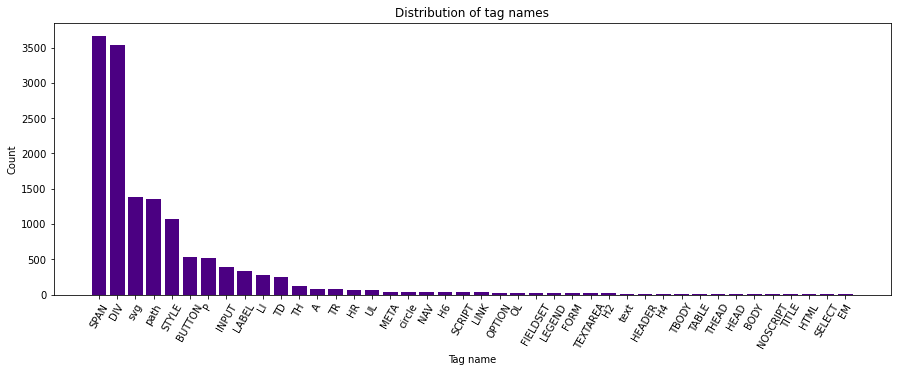

In [79]:
plot_tag_names(df_json_10sites, 'tag_name')

In [124]:
df_json_10sites['label'].value_counts()

n/a                  12061
icon                   596
radio                  223
typography             192
chip                   163
button                 115
divider                 90
link                    67
accordion               62
checkbox                62
list                    54
grid                    54
progress                33
avatar                  29
badge                   24
paper                   23
switch                  21
popover                 21
radiogroup              19
backdrop                19
stepper                 18
tabs                    18
box                     17
text-field              16
container               16
menu                    15
snackbar                15
select                  15
breadcrumbs             15
drawer                  15
app-bar                 13
bottom-navigation       13
card                    12
table                   11
slider                  11
textarea-autosize        9
alert                    8
b

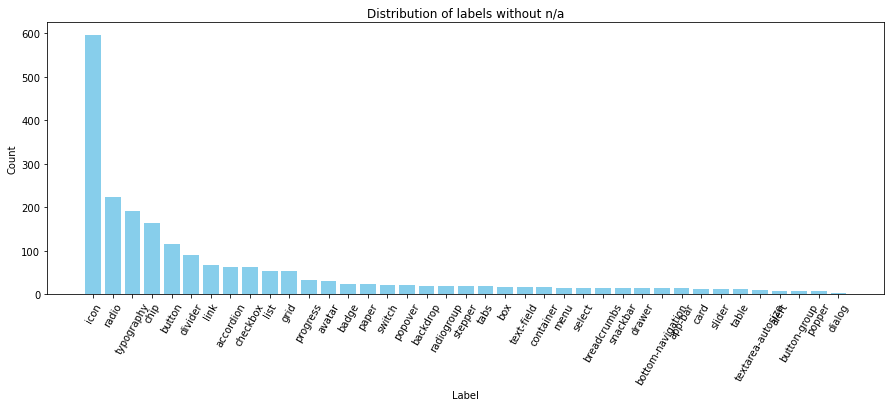

In [80]:
plot_labels(df_json_10sites, 'label')

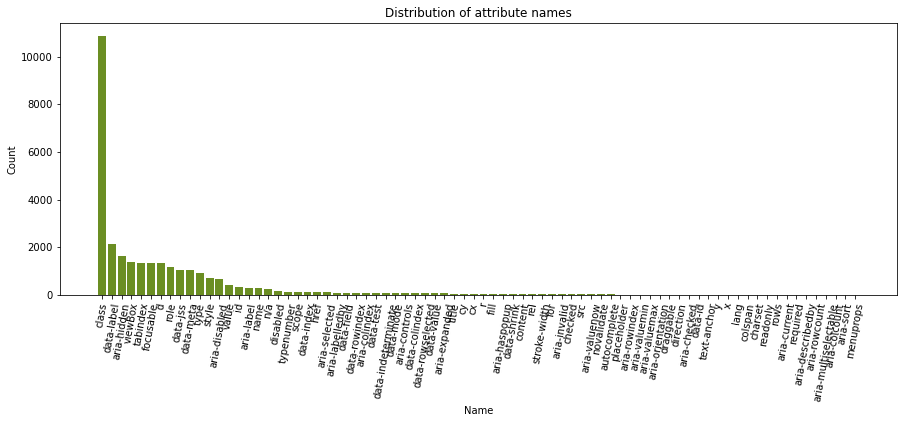

In [81]:
plot_attr_names(df_json_10sites, 'attributes')

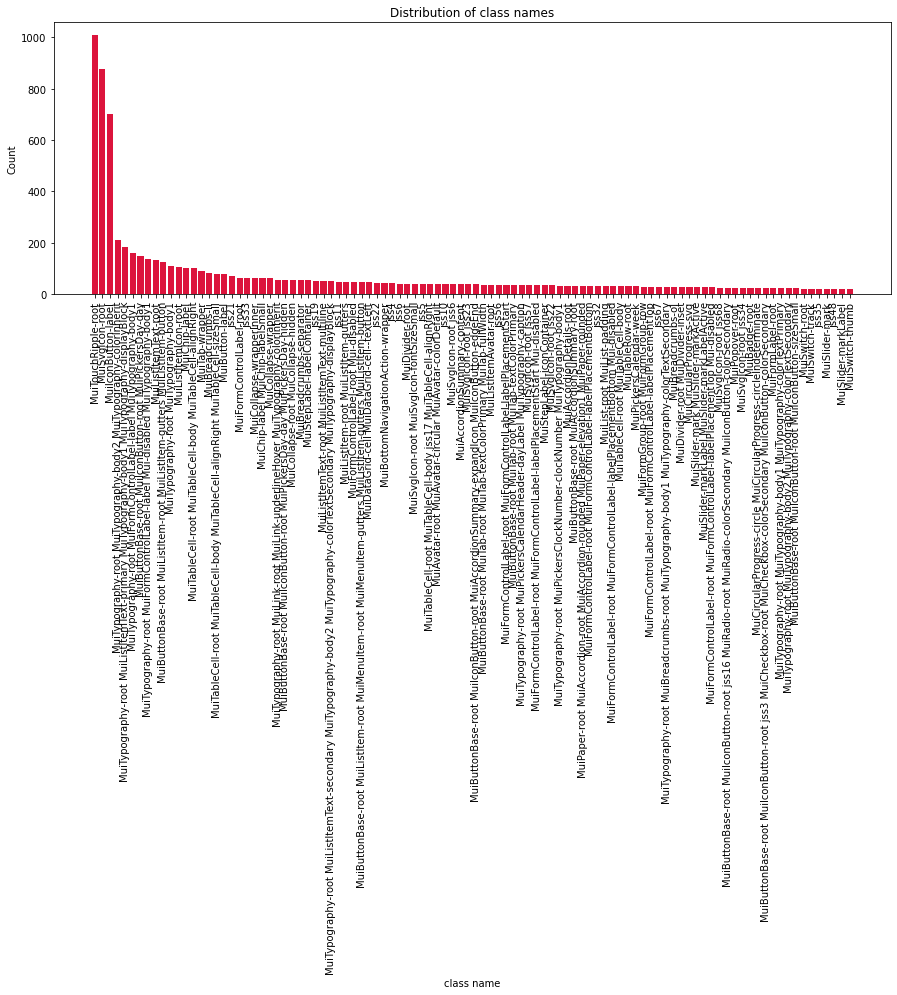

In [82]:
plot_class_names(df_json_10sites, 'attributes', 'class', thresh = 20)

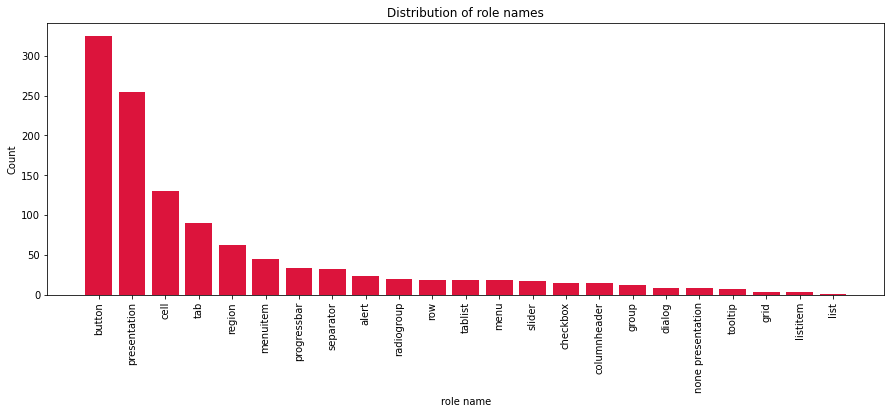

In [83]:
plot_class_names(df_json_10sites, 'attributes', 'role', thresh = 0)

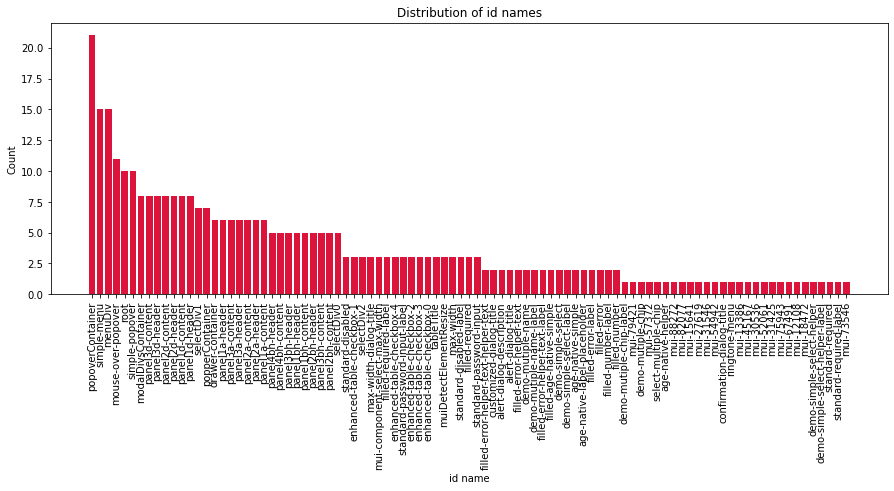

In [84]:
plot_class_names(df_json_10sites, 'attributes', 'id', thresh = 0)

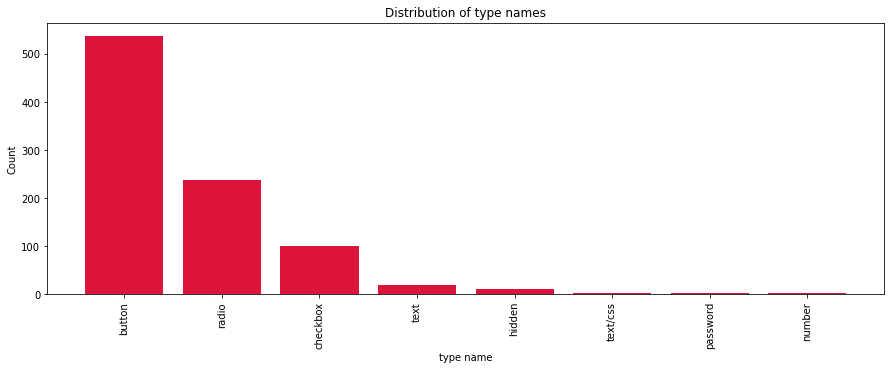

In [85]:
plot_class_names(df_json_10sites, 'attributes', 'type', thresh = 0)

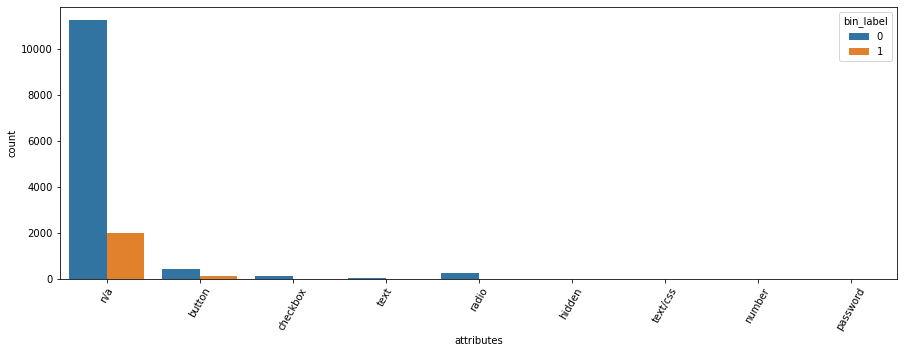

In [113]:
type_values = df_json_10sites['attributes'].apply(lambda x: x.get('type') if x is not None else 'n/a').fillna('n/a')
plt.figure(figsize=(15,5))
sns.countplot(x=type_values, hue = df_json_10sites['bin_label'], data=df_json_10sites[])
plt.xticks(rotation=60);


In [119]:
aria_hid_values = df_json_10sites['attributes'].apply(lambda x: x.get('aria-hidden') if x is not None else 'n/a').fillna('n/a')

In [121]:
aria_hid_values.unique()

array(['n/a', 'true'], dtype=object)

In [122]:
viewBox_values = df_json_10sites['attributes'].apply(lambda x: x.get('viewBox') if x is not None else 'n/a').fillna('n/a')

In [123]:
viewBox_values.unique()

array(['n/a', '0 0 24 24', '22 22 44 44'], dtype=object)

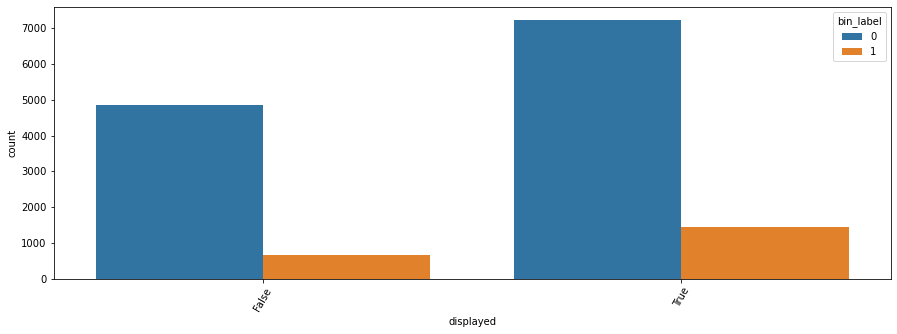

In [116]:
plt.figure(figsize=(15,5))
sns.countplot(x=df_json_10sites['displayed'], hue = df_json_10sites['bin_label'])
plt.xticks(rotation=60);

In [117]:
from scipy.stats import chi2_contingency
chi2_contingency(pd.crosstab(df_json_10sites['displayed'],df_json_10sites['bin_label']))


(61.974856315514565,
 3.4787089450390725e-15,
 1,
 array([[4676.59279368,  822.40720632],
        [7384.40720632, 1298.59279368]]))

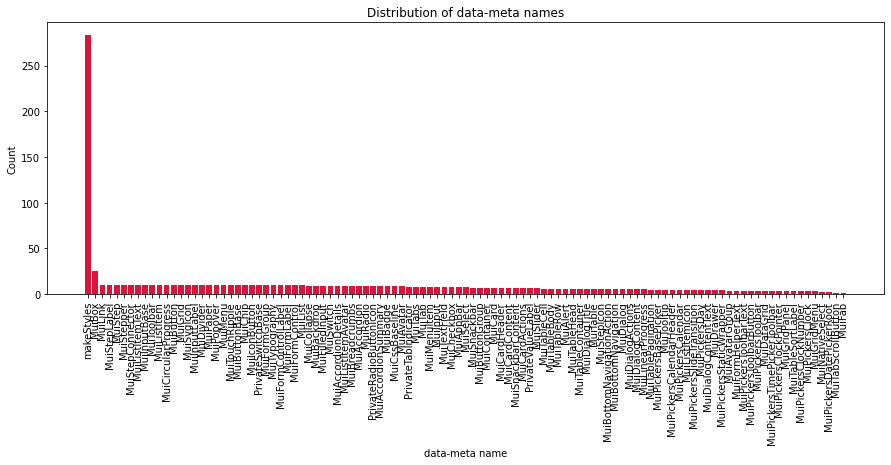

In [86]:
plot_class_names(df_json_10sites, 'attributes', 'data-meta', thresh = 0)

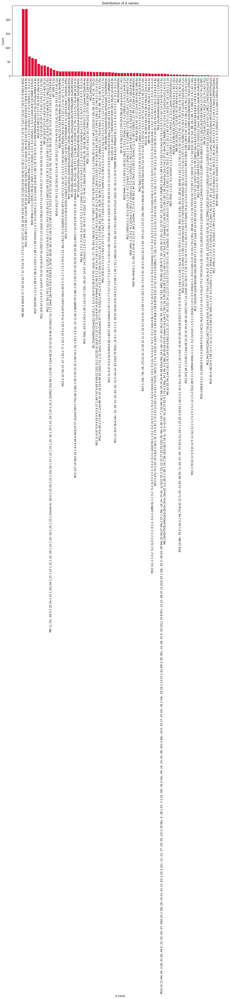

In [106]:
plot_class_names(df_json_10sites, 'attributes', 'd', thresh = 0)

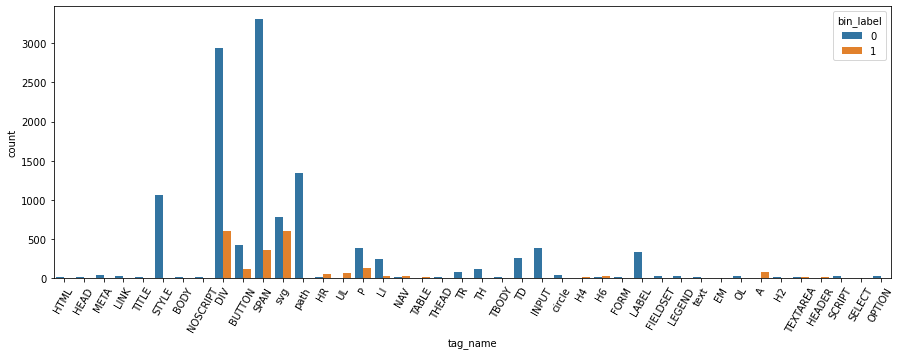

In [87]:
plt.figure(figsize=(15,5))
sns.countplot(x=df_json_10sites['tag_name'], hue = df_json_10sites['bin_label'], data=df_json_10sites)
plt.xticks(rotation=60);

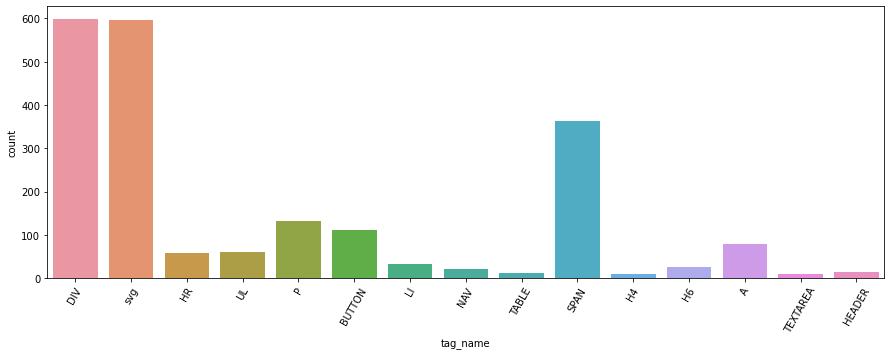

In [88]:
plt.figure(figsize=(15,5))
sns.countplot(x=df_json_10sites['tag_name'][df_json_10sites['bin_label']==1], data=df_json_10sites)
plt.xticks(rotation=60);

In [89]:
from sklearn.feature_extraction.text import CountVectorizer

In [90]:
attr_class_series = df_json_10sites.attributes.apply(lambda x: None if x is None else x.get('class')).fillna('')
attr_class_series.value_counts()

                                                                             3314
MuiTouchRipple-root                                                          1008
MuiSvgIcon-root                                                               876
MuiIconButton-label                                                           702
MuiTypography-root MuiTypography-body2 MuiTypography-colorInherit             210
                                                                             ... 
jss39 jss40                                                                     1
MuiTypography-root jss79 MuiTypography-body1                                    1
MuiBackdrop-root jss36                                                          1
MuiPaper-root jss2 MuiPaper-elevation1 MuiPaper-rounded                         1
MuiPaper-root MuiPopover-paper jss85 MuiPaper-elevation8 MuiPaper-rounded       1
Name: attributes, Length: 967, dtype: int64

In [91]:
cv = CountVectorizer()

In [92]:
attr_class_series.values

array(['', '', '', ...,
       'MuiPaper-root MuiPopover-paper jss85 MuiPaper-elevation8 MuiPaper-rounded',
       'MuiTypography-root MuiTypography-body1', ''], dtype=object)

In [93]:
cv.fit(attr_class_series.values)

CountVectorizer()

In [94]:
len(cv.vocabulary_.keys())

489

In [96]:
vocabulary = sorted([v for v in cv.vocabulary_.keys() if re.match(r'^[a-z]+$',v ) and len(v) > 2])

In [97]:
len(vocabulary)

367

In [98]:
from scipy.stats import chi2_contingency

In [99]:
stat, p, dof, expected = chi2_contingency(pd.crosstab(df_json_10sites['label'], df_json_10sites['tag_name'].fillna('n/a')))

In [100]:
len(expected[expected < 5])/len(expected)

39.025

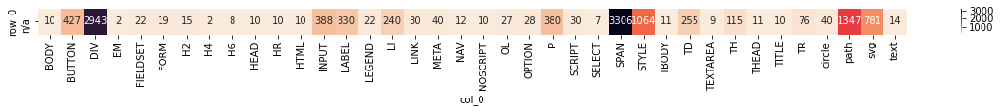

In [101]:
plt.figure(figsize=(20,0.5))
sns.heatmap(pd.crosstab(np.array(df_json_10sites['label'][df_json_10sites['label'] == 'n/a']),np.array(df_json_10sites['tag_name'][df_json_10sites['label'] == 'n/a'])) , cmap='rocket_r', annot=True, fmt='g');

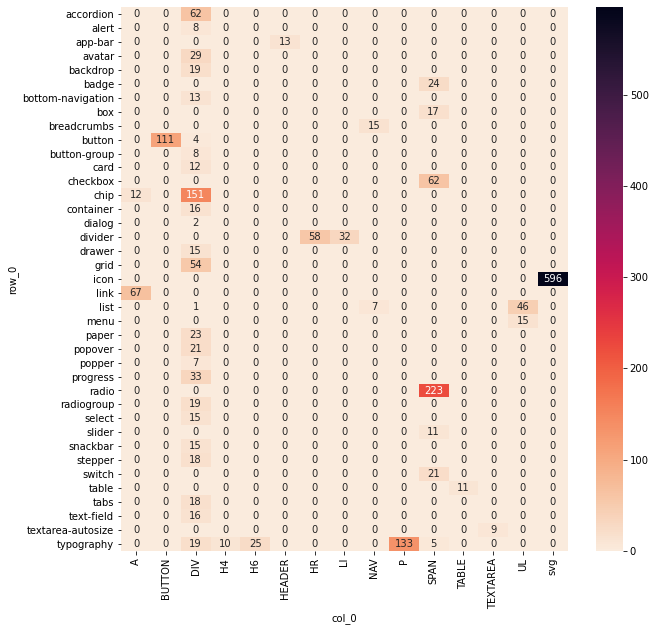

In [102]:
plt.figure(figsize=(10,10))
sns.heatmap(pd.crosstab(np.array(df_json_10sites['label'][df_json_10sites['label'] != 'n/a']),np.array(df_json_10sites['tag_name'][df_json_10sites['label'] != 'n/a'])) , cmap='rocket_r', annot=True, fmt='g');

In [103]:
df_json_10sites['class'] = df_json_10sites.attributes.apply(lambda x: None if x is None else x.get('class')).fillna('')

In [104]:
df_json_10sites['class']

0                                                        
1                                                        
2                                                        
3                                                        
4                                                        
                              ...                        
1357                                                     
1358                                                     
1359    MuiPaper-root MuiPopover-paper jss85 MuiPaper-...
1360               MuiTypography-root MuiTypography-body1
1361                                                     
Name: class, Length: 14182, dtype: object

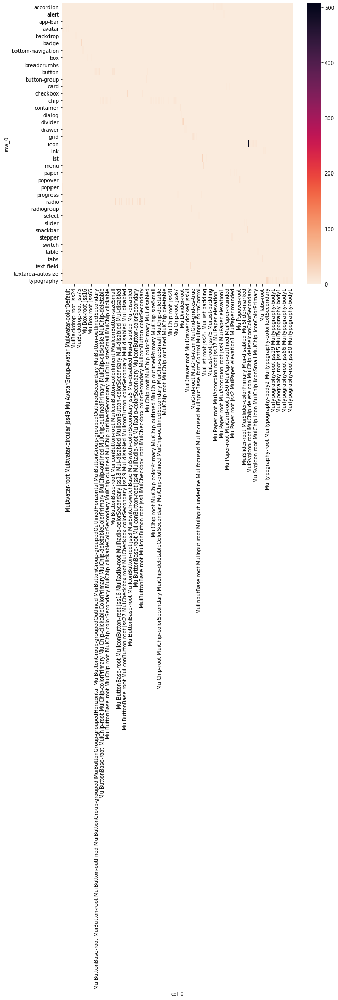

In [105]:
plt.figure(figsize=(10,10))
sns.heatmap(pd.crosstab(np.array(df_json_10sites['label'][df_json_10sites['label'] != 'n/a']),np.array(df_json_10sites['class'][df_json_10sites['label'] != 'n/a'])) , cmap='rocket_r', fmt='g');

In [48]:
from collections import defaultdict

In [50]:
siblings_dict = defaultdict(dict)
print(siblings_dict)
for idx, r in elements_df.iterrows():
    if (r.parent_id == r.element_id) or (r.parent_id is None):
        continue

    p = siblings_dict[r.parent_id]
    print(p)
    print(siblings_dict)
    p[r.element_id] = idx
    print(p)
    print(siblings_dict)

defaultdict(<class 'dict'>, {})
{}
defaultdict(<class 'dict'>, {'6891346991025170132624238003': {}})
{'9584807185025170132733641804': 1}
defaultdict(<class 'dict'>, {'6891346991025170132624238003': {'9584807185025170132733641804': 1}})
{'9584807185025170132733641804': 1}
defaultdict(<class 'dict'>, {'6891346991025170132624238003': {'9584807185025170132733641804': 1}})
{'9584807185025170132733641804': 1, '1002984834025170138982302814': 2}
defaultdict(<class 'dict'>, {'6891346991025170132624238003': {'9584807185025170132733641804': 1, '1002984834025170138982302814': 2}})


In [45]:
elements_df

,attributes,displayed,element_id,height,onmouseenter,onmouseover,parent_id,style,tag_name,text,width,x,y
0,None,True,6891346991025170132624238003,4000,None,None,None,"[align-content, align-items, align-self, align...",HTML,,1500,0,0
1,None,False,9584807185025170132733641804,0,None,None,6891346991025170132624238003,"[align-content, align-items, align-self, align...",HEAD,,0,0,0
2,None,True,1002984834025170138982302814,3984,None,None,6891346991025170132624238003,"[align-content, align-items, align-self, align...",BODY,,1484,8,8


In [43]:
from pprint import pprint

In [44]:
pprint(siblings_dict)

defaultdict(<class 'dict'>,
            {'6891346991025170132624238003': {'1002984834025170138982302814': 2,
                                              '9584807185025170132733641804': 1}})


### Collecting 60 datasets

In [16]:
n_datasets = 120
SITE_URLS = [f'file:///C:/WORK/jdi-qasp-ml/MUI_model/dataset/site{i}/index.html' for i in range (1,n_datasets+1)]
DATASET_NAMES = [f'mui-site{i}' for i in range (1,n_datasets+1)]

2021-08-20 12:55:22,131 -INFO - dataset_builder:dataset_builder.py:78 - Dataset name: mui-site1
2021-08-20 12:55:22,148 -INFO - dataset_builder:dataset_builder.py:87 - Create directories to save the dataset
2021-08-20 12:55:22,149 -INFO - dataset_builder:dataset_builder.py:125 - Creating driver
2021-08-20 12:55:23,370 -INFO - dataset_builder:dataset_builder.py:136 - Chrome web driver is created
2021-08-20 12:55:23,372 -INFO - 2680027374:2680027374.py:6 - getting page
2021-08-20 12:55:30,888 -INFO - dataset_builder:dataset_builder.py:139 - save scrinshot: dataset/images/mui-site1.png
2021-08-20 12:55:31,726 -INFO - dataset_builder:dataset_builder.py:183 - Collect features using JS script
2021-08-20 12:55:35,392 -INFO - dataset_builder:dataset_builder.py:191 - Save html to dataset/html/mui-site1.html
2021-08-20 12:55:35,495 -INFO - dataset_builder:dataset_builder.py:201 - Save parquet to dataset/df/mui-site1.parquet
2021-08-20 12:55:35,503 -INFO - dataset_builder:dataset_builder.py:203 -

2021-08-20 12:57:01,990 -INFO - 2680027374:2680027374.py:6 - getting page
2021-08-20 12:57:09,512 -INFO - dataset_builder:dataset_builder.py:139 - save scrinshot: dataset/images/mui-site8.png
2021-08-20 12:57:10,468 -INFO - dataset_builder:dataset_builder.py:183 - Collect features using JS script
2021-08-20 12:57:13,646 -INFO - dataset_builder:dataset_builder.py:191 - Save html to dataset/html/mui-site8.html
2021-08-20 12:57:13,719 -INFO - dataset_builder:dataset_builder.py:201 - Save parquet to dataset/df/mui-site8.parquet
2021-08-20 12:57:13,727 -INFO - dataset_builder:dataset_builder.py:203 - No attributes: (20, 13)
2021-08-20 12:57:14,285 -INFO - dataset_builder:dataset_builder.py:102 - Close web driver
2021-08-20 12:57:14,406 -INFO - dataset_builder:dataset_builder.py:78 - Dataset name: mui-site9
2021-08-20 12:57:14,408 -INFO - dataset_builder:dataset_builder.py:87 - Create directories to save the dataset
2021-08-20 12:57:14,413 -INFO - dataset_builder:dataset_builder.py:125 - Cre

2021-08-20 12:59:20,341 -INFO - dataset_builder:dataset_builder.py:201 - Save parquet to dataset/df/mui-site15.parquet
2021-08-20 12:59:20,353 -INFO - dataset_builder:dataset_builder.py:203 - No attributes: (24, 13)
2021-08-20 12:59:21,013 -INFO - dataset_builder:dataset_builder.py:102 - Close web driver
2021-08-20 12:59:21,097 -INFO - dataset_builder:dataset_builder.py:78 - Dataset name: mui-site16
2021-08-20 12:59:21,097 -INFO - dataset_builder:dataset_builder.py:87 - Create directories to save the dataset
2021-08-20 12:59:21,109 -INFO - dataset_builder:dataset_builder.py:125 - Creating driver
2021-08-20 12:59:22,191 -INFO - dataset_builder:dataset_builder.py:136 - Chrome web driver is created
2021-08-20 12:59:22,195 -INFO - 2680027374:2680027374.py:6 - getting page
2021-08-20 12:59:29,765 -INFO - dataset_builder:dataset_builder.py:139 - save scrinshot: dataset/images/mui-site16.png
2021-08-20 12:59:30,844 -INFO - dataset_builder:dataset_builder.py:183 - Collect features using JS scr

2021-08-20 13:01:01,127 -INFO - dataset_builder:dataset_builder.py:87 - Create directories to save the dataset
2021-08-20 13:01:01,130 -INFO - dataset_builder:dataset_builder.py:125 - Creating driver
2021-08-20 13:01:02,130 -INFO - dataset_builder:dataset_builder.py:136 - Chrome web driver is created
2021-08-20 13:01:02,132 -INFO - 2680027374:2680027374.py:6 - getting page
2021-08-20 13:01:09,688 -INFO - dataset_builder:dataset_builder.py:139 - save scrinshot: dataset/images/mui-site23.png
2021-08-20 13:01:10,593 -INFO - dataset_builder:dataset_builder.py:183 - Collect features using JS script
2021-08-20 13:01:14,333 -INFO - dataset_builder:dataset_builder.py:191 - Save html to dataset/html/mui-site23.html
2021-08-20 13:01:14,401 -INFO - dataset_builder:dataset_builder.py:201 - Save parquet to dataset/df/mui-site23.parquet
2021-08-20 13:01:14,401 -INFO - dataset_builder:dataset_builder.py:203 - No attributes: (18, 13)
2021-08-20 13:01:15,025 -INFO - dataset_builder:dataset_builder.py:1

2021-08-20 13:02:49,618 -INFO - dataset_builder:dataset_builder.py:139 - save scrinshot: dataset/images/mui-site30.png
2021-08-20 13:02:50,711 -INFO - dataset_builder:dataset_builder.py:183 - Collect features using JS script
2021-08-20 13:02:55,024 -INFO - dataset_builder:dataset_builder.py:191 - Save html to dataset/html/mui-site30.html
2021-08-20 13:02:55,109 -INFO - dataset_builder:dataset_builder.py:201 - Save parquet to dataset/df/mui-site30.parquet
2021-08-20 13:02:55,117 -INFO - dataset_builder:dataset_builder.py:203 - No attributes: (22, 13)
2021-08-20 13:02:55,794 -INFO - dataset_builder:dataset_builder.py:102 - Close web driver
2021-08-20 13:02:55,886 -INFO - dataset_builder:dataset_builder.py:78 - Dataset name: mui-site31
2021-08-20 13:02:55,895 -INFO - dataset_builder:dataset_builder.py:87 - Create directories to save the dataset
2021-08-20 13:02:55,899 -INFO - dataset_builder:dataset_builder.py:125 - Creating driver
2021-08-20 13:02:56,973 -INFO - dataset_builder:dataset_b

2021-08-20 13:04:35,715 -INFO - dataset_builder:dataset_builder.py:203 - No attributes: (38, 13)
2021-08-20 13:04:36,389 -INFO - dataset_builder:dataset_builder.py:102 - Close web driver
2021-08-20 13:04:36,474 -INFO - dataset_builder:dataset_builder.py:78 - Dataset name: mui-site38
2021-08-20 13:04:36,482 -INFO - dataset_builder:dataset_builder.py:87 - Create directories to save the dataset
2021-08-20 13:04:36,487 -INFO - dataset_builder:dataset_builder.py:125 - Creating driver
2021-08-20 13:04:37,555 -INFO - dataset_builder:dataset_builder.py:136 - Chrome web driver is created
2021-08-20 13:04:37,555 -INFO - 2680027374:2680027374.py:6 - getting page
2021-08-20 13:04:45,135 -INFO - dataset_builder:dataset_builder.py:139 - save scrinshot: dataset/images/mui-site38.png
2021-08-20 13:04:46,143 -INFO - dataset_builder:dataset_builder.py:183 - Collect features using JS script
2021-08-20 13:04:50,482 -INFO - dataset_builder:dataset_builder.py:191 - Save html to dataset/html/mui-site38.html


2021-08-20 13:06:15,959 -INFO - dataset_builder:dataset_builder.py:125 - Creating driver
2021-08-20 13:06:17,019 -INFO - dataset_builder:dataset_builder.py:136 - Chrome web driver is created
2021-08-20 13:06:17,019 -INFO - 2680027374:2680027374.py:6 - getting page
2021-08-20 13:06:24,626 -INFO - dataset_builder:dataset_builder.py:139 - save scrinshot: dataset/images/mui-site45.png
2021-08-20 13:06:25,592 -INFO - dataset_builder:dataset_builder.py:183 - Collect features using JS script
2021-08-20 13:06:29,786 -INFO - dataset_builder:dataset_builder.py:191 - Save html to dataset/html/mui-site45.html
2021-08-20 13:06:29,847 -INFO - dataset_builder:dataset_builder.py:201 - Save parquet to dataset/df/mui-site45.parquet
2021-08-20 13:06:29,855 -INFO - dataset_builder:dataset_builder.py:203 - No attributes: (25, 13)
2021-08-20 13:06:30,504 -INFO - dataset_builder:dataset_builder.py:102 - Close web driver
2021-08-20 13:06:30,590 -INFO - dataset_builder:dataset_builder.py:78 - Dataset name: mui

2021-08-20 13:09:01,852 -INFO - dataset_builder:dataset_builder.py:183 - Collect features using JS script
2021-08-20 13:09:03,432 -INFO - dataset_builder:dataset_builder.py:191 - Save html to dataset/html/mui-site52.html
2021-08-20 13:09:03,462 -INFO - dataset_builder:dataset_builder.py:201 - Save parquet to dataset/df/mui-site52.parquet
2021-08-20 13:09:03,462 -INFO - dataset_builder:dataset_builder.py:203 - No attributes: (21, 13)
2021-08-20 13:09:03,753 -INFO - dataset_builder:dataset_builder.py:102 - Close web driver
2021-08-20 13:09:03,831 -INFO - dataset_builder:dataset_builder.py:78 - Dataset name: mui-site53
2021-08-20 13:09:03,839 -INFO - dataset_builder:dataset_builder.py:87 - Create directories to save the dataset
2021-08-20 13:09:03,841 -INFO - dataset_builder:dataset_builder.py:125 - Creating driver
2021-08-20 13:09:04,882 -INFO - dataset_builder:dataset_builder.py:136 - Chrome web driver is created
2021-08-20 13:09:04,882 -INFO - 2680027374:2680027374.py:6 - getting page


2021-08-20 13:10:17,385 -INFO - dataset_builder:dataset_builder.py:102 - Close web driver
2021-08-20 13:10:17,458 -INFO - dataset_builder:dataset_builder.py:78 - Dataset name: mui-site60
2021-08-20 13:10:17,458 -INFO - dataset_builder:dataset_builder.py:87 - Create directories to save the dataset
2021-08-20 13:10:17,469 -INFO - dataset_builder:dataset_builder.py:125 - Creating driver
2021-08-20 13:10:18,440 -INFO - dataset_builder:dataset_builder.py:136 - Chrome web driver is created
2021-08-20 13:10:18,440 -INFO - 2680027374:2680027374.py:6 - getting page
2021-08-20 13:10:26,068 -INFO - dataset_builder:dataset_builder.py:139 - save scrinshot: dataset/images/mui-site60.png
2021-08-20 13:10:26,416 -INFO - dataset_builder:dataset_builder.py:183 - Collect features using JS script
2021-08-20 13:10:27,702 -INFO - dataset_builder:dataset_builder.py:191 - Save html to dataset/html/mui-site60.html
2021-08-20 13:10:27,722 -INFO - dataset_builder:dataset_builder.py:201 - Save parquet to dataset/

2021-08-20 13:11:32,953 -INFO - dataset_builder:dataset_builder.py:136 - Chrome web driver is created
2021-08-20 13:11:32,954 -INFO - 2680027374:2680027374.py:6 - getting page
2021-08-20 13:11:40,440 -INFO - dataset_builder:dataset_builder.py:139 - save scrinshot: dataset/images/mui-site67.png
2021-08-20 13:11:40,748 -INFO - dataset_builder:dataset_builder.py:183 - Collect features using JS script
2021-08-20 13:11:41,821 -INFO - dataset_builder:dataset_builder.py:191 - Save html to dataset/html/mui-site67.html
2021-08-20 13:11:41,845 -INFO - dataset_builder:dataset_builder.py:201 - Save parquet to dataset/df/mui-site67.parquet
2021-08-20 13:11:41,845 -INFO - dataset_builder:dataset_builder.py:203 - No attributes: (34, 13)
2021-08-20 13:11:42,095 -INFO - dataset_builder:dataset_builder.py:102 - Close web driver
2021-08-20 13:11:42,189 -INFO - dataset_builder:dataset_builder.py:78 - Dataset name: mui-site68
2021-08-20 13:11:42,190 -INFO - dataset_builder:dataset_builder.py:87 - Create di

2021-08-20 13:12:57,605 -INFO - dataset_builder:dataset_builder.py:191 - Save html to dataset/html/mui-site74.html
2021-08-20 13:12:57,641 -INFO - dataset_builder:dataset_builder.py:201 - Save parquet to dataset/df/mui-site74.parquet
2021-08-20 13:12:57,641 -INFO - dataset_builder:dataset_builder.py:203 - No attributes: (27, 13)
2021-08-20 13:12:57,971 -INFO - dataset_builder:dataset_builder.py:102 - Close web driver
2021-08-20 13:12:58,064 -INFO - dataset_builder:dataset_builder.py:78 - Dataset name: mui-site75
2021-08-20 13:12:58,065 -INFO - dataset_builder:dataset_builder.py:87 - Create directories to save the dataset
2021-08-20 13:12:58,067 -INFO - dataset_builder:dataset_builder.py:125 - Creating driver
2021-08-20 13:12:59,057 -INFO - dataset_builder:dataset_builder.py:136 - Chrome web driver is created
2021-08-20 13:12:59,057 -INFO - 2680027374:2680027374.py:6 - getting page
2021-08-20 13:13:06,587 -INFO - dataset_builder:dataset_builder.py:139 - save scrinshot: dataset/images/mu

2021-08-20 13:14:11,363 -INFO - dataset_builder:dataset_builder.py:78 - Dataset name: mui-site82
2021-08-20 13:14:11,366 -INFO - dataset_builder:dataset_builder.py:87 - Create directories to save the dataset
2021-08-20 13:14:11,368 -INFO - dataset_builder:dataset_builder.py:125 - Creating driver
2021-08-20 13:14:12,427 -INFO - dataset_builder:dataset_builder.py:136 - Chrome web driver is created
2021-08-20 13:14:12,427 -INFO - 2680027374:2680027374.py:6 - getting page
2021-08-20 13:14:20,021 -INFO - dataset_builder:dataset_builder.py:139 - save scrinshot: dataset/images/mui-site82.png
2021-08-20 13:14:20,331 -INFO - dataset_builder:dataset_builder.py:183 - Collect features using JS script
2021-08-20 13:14:21,564 -INFO - dataset_builder:dataset_builder.py:191 - Save html to dataset/html/mui-site82.html
2021-08-20 13:14:21,587 -INFO - dataset_builder:dataset_builder.py:201 - Save parquet to dataset/df/mui-site82.parquet
2021-08-20 13:14:21,587 -INFO - dataset_builder:dataset_builder.py:2

2021-08-20 13:16:44,194 -INFO - 2680027374:2680027374.py:6 - getting page
2021-08-20 13:16:51,727 -INFO - dataset_builder:dataset_builder.py:139 - save scrinshot: dataset/images/mui-site89.png
2021-08-20 13:16:52,014 -INFO - dataset_builder:dataset_builder.py:183 - Collect features using JS script
2021-08-20 13:16:53,142 -INFO - dataset_builder:dataset_builder.py:191 - Save html to dataset/html/mui-site89.html
2021-08-20 13:16:53,169 -INFO - dataset_builder:dataset_builder.py:201 - Save parquet to dataset/df/mui-site89.parquet
2021-08-20 13:16:53,177 -INFO - dataset_builder:dataset_builder.py:203 - No attributes: (25, 13)
2021-08-20 13:16:53,435 -INFO - dataset_builder:dataset_builder.py:102 - Close web driver
2021-08-20 13:16:53,515 -INFO - dataset_builder:dataset_builder.py:78 - Dataset name: mui-site90
2021-08-20 13:16:53,516 -INFO - dataset_builder:dataset_builder.py:87 - Create directories to save the dataset
2021-08-20 13:16:53,518 -INFO - dataset_builder:dataset_builder.py:125 -

2021-08-20 13:18:09,942 -INFO - dataset_builder:dataset_builder.py:201 - Save parquet to dataset/df/mui-site96.parquet
2021-08-20 13:18:09,943 -INFO - dataset_builder:dataset_builder.py:203 - No attributes: (27, 13)
2021-08-20 13:18:10,295 -INFO - dataset_builder:dataset_builder.py:102 - Close web driver
2021-08-20 13:18:10,380 -INFO - dataset_builder:dataset_builder.py:78 - Dataset name: mui-site97
2021-08-20 13:18:10,387 -INFO - dataset_builder:dataset_builder.py:87 - Create directories to save the dataset
2021-08-20 13:18:10,389 -INFO - dataset_builder:dataset_builder.py:125 - Creating driver
2021-08-20 13:18:11,468 -INFO - dataset_builder:dataset_builder.py:136 - Chrome web driver is created
2021-08-20 13:18:11,468 -INFO - 2680027374:2680027374.py:6 - getting page
2021-08-20 13:18:19,006 -INFO - dataset_builder:dataset_builder.py:139 - save scrinshot: dataset/images/mui-site97.png
2021-08-20 13:18:19,299 -INFO - dataset_builder:dataset_builder.py:183 - Collect features using JS scr

2021-08-20 13:19:24,699 -INFO - dataset_builder:dataset_builder.py:87 - Create directories to save the dataset
2021-08-20 13:19:24,702 -INFO - dataset_builder:dataset_builder.py:125 - Creating driver
2021-08-20 13:19:25,778 -INFO - dataset_builder:dataset_builder.py:136 - Chrome web driver is created
2021-08-20 13:19:25,778 -INFO - 2680027374:2680027374.py:6 - getting page
2021-08-20 13:19:33,283 -INFO - dataset_builder:dataset_builder.py:139 - save scrinshot: dataset/images/mui-site104.png
2021-08-20 13:19:33,609 -INFO - dataset_builder:dataset_builder.py:183 - Collect features using JS script
2021-08-20 13:19:34,660 -INFO - dataset_builder:dataset_builder.py:191 - Save html to dataset/html/mui-site104.html
2021-08-20 13:19:34,680 -INFO - dataset_builder:dataset_builder.py:201 - Save parquet to dataset/df/mui-site104.parquet
2021-08-20 13:19:34,680 -INFO - dataset_builder:dataset_builder.py:203 - No attributes: (26, 13)
2021-08-20 13:19:34,949 -INFO - dataset_builder:dataset_builder.p

2021-08-20 13:20:46,355 -INFO - dataset_builder:dataset_builder.py:139 - save scrinshot: dataset/images/mui-site111.png
2021-08-20 13:20:46,776 -INFO - dataset_builder:dataset_builder.py:183 - Collect features using JS script
2021-08-20 13:20:48,161 -INFO - dataset_builder:dataset_builder.py:191 - Save html to dataset/html/mui-site111.html
2021-08-20 13:20:48,187 -INFO - dataset_builder:dataset_builder.py:201 - Save parquet to dataset/df/mui-site111.parquet
2021-08-20 13:20:48,187 -INFO - dataset_builder:dataset_builder.py:203 - No attributes: (17, 13)
2021-08-20 13:20:48,519 -INFO - dataset_builder:dataset_builder.py:102 - Close web driver
2021-08-20 13:20:48,602 -INFO - dataset_builder:dataset_builder.py:78 - Dataset name: mui-site112
2021-08-20 13:20:48,604 -INFO - dataset_builder:dataset_builder.py:87 - Create directories to save the dataset
2021-08-20 13:20:48,605 -INFO - dataset_builder:dataset_builder.py:125 - Creating driver
2021-08-20 13:20:49,713 -INFO - dataset_builder:datas

2021-08-20 13:22:03,838 -INFO - dataset_builder:dataset_builder.py:201 - Save parquet to dataset/df/mui-site118.parquet
2021-08-20 13:22:03,838 -INFO - dataset_builder:dataset_builder.py:203 - No attributes: (30, 13)
2021-08-20 13:22:04,138 -INFO - dataset_builder:dataset_builder.py:102 - Close web driver
2021-08-20 13:22:04,222 -INFO - dataset_builder:dataset_builder.py:78 - Dataset name: mui-site119
2021-08-20 13:22:04,224 -INFO - dataset_builder:dataset_builder.py:87 - Create directories to save the dataset
2021-08-20 13:22:04,224 -INFO - dataset_builder:dataset_builder.py:125 - Creating driver
2021-08-20 13:22:05,262 -INFO - dataset_builder:dataset_builder.py:136 - Chrome web driver is created
2021-08-20 13:22:05,262 -INFO - 2680027374:2680027374.py:6 - getting page
2021-08-20 13:22:12,802 -INFO - dataset_builder:dataset_builder.py:139 - save scrinshot: dataset/images/mui-site119.png
2021-08-20 13:22:13,170 -INFO - dataset_builder:dataset_builder.py:183 - Collect features using JS 

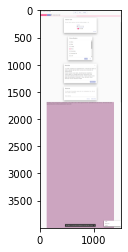

In [43]:
%%time
df120 = collect_many_ds(SITE_URLS,DATASET_NAMES)

In [62]:
# df120.to_csv('df120sites.csv', index=False)

In [45]:
df120.to_pickle('dataset/df120sites.pkl')

In [189]:
df120 = pd.read_pickle('dataset/df120sites.pkl')

In [27]:
df120.dtypes

attributes       object
displayed          bool
element_id       object
height          float64
onmouseenter    float64
onmouseover     float64
parent_id        object
style            object
tag_name         object
text             object
width           float64
x               float64
y               float64
idx               int64
ds_name          object
dtype: object

In [22]:
df120.head()

,attributes,displayed,element_id,height,onmouseenter,onmouseover,parent_id,style,tag_name,text,width,x,y,idx,ds_name
0,{'lang': 'en'},False,5896299165703676224727101042,15091.265625,NaN,NaN,NaN,"['align-content', 'align-items', 'align-self',...",HTML,Recents\nFavorites\nNearby\nInbox\nStarred\nSe...,1474.0,0.0,-10159.0,0,mui-site1
1,NaN,False,9256172194703676220965493383,0.000000,NaN,NaN,5896299165703676224727101042,"['align-content', 'align-items', 'align-self',...",HEAD,React App\n.MuiSvgIcon-root {\n fill: current...,0.0,0.0,0.0,1,mui-site1
2,{'charset': 'utf-8'},False,4153191587703676226229689035,0.000000,NaN,NaN,9256172194703676220965493383,"['align-content', 'align-items', 'align-self',...",META,NaN,0.0,0.0,0.0,2,mui-site1
3,"{'href': './favicon.ico', 'rel': 'icon'}",False,2493197671703676220135792064,0.000000,NaN,NaN,9256172194703676220965493383,"['align-content', 'align-items', 'align-self',...",LINK,NaN,0.0,0.0,0.0,3,mui-site1
4,"{'content': 'width=device-width,initial-scale=...",False,1015868367703676225024921418,0.000000,NaN,NaN,9256172194703676220965493383,"['align-content', 'align-items', 'align-self',...",META,NaN,0.0,0.0,0.0,4,mui-site1


In [46]:
df120['class'] = df120.attributes.apply(lambda x: x.get('class') if x is not None else 'n/a').fillna('n/a')

In [52]:
df120['class'] = df120['class'].apply(lambda x: x.split(sep=' ') if x is not 'n/a' else 'n/a')

In [58]:
class_names = list(itertools.chain.from_iterable(df120['class'].to_list()))

In [62]:
np.unique(class_names)

array(['Mui-checked', 'Mui-disabled', 'Mui-error', 'Mui-even',
       'Mui-expanded', 'Mui-focusVisible', 'Mui-focused', 'Mui-odd',
       'Mui-required', 'Mui-resizeTriggers', 'Mui-selected',
       'MuiAccordion-root', 'MuiAccordion-rounded',
       'MuiAccordionDetails-root', 'MuiAccordionSummary-content',
       'MuiAccordionSummary-expandIcon', 'MuiAccordionSummary-root',
       'MuiAlert-filledError', 'MuiAlert-filledInfo',
       'MuiAlert-filledSuccess', 'MuiAlert-filledWarning',
       'MuiAlert-icon', 'MuiAlert-message', 'MuiAlert-root',
       'MuiAppBar-colorPrimary', 'MuiAppBar-positionStatic',
       'MuiAppBar-root', 'MuiAvatar-circular', 'MuiAvatar-colorDefault',
       'MuiAvatar-root', 'MuiAvatar-rounded', 'MuiAvatar-square',
       'MuiAvatarGroup-avatar', 'MuiAvatarGroup-root', 'MuiBackdrop-root',
       'MuiBadge-anchorOriginTopRightRectangle', 'MuiBadge-badge',
       'MuiBadge-colorError', 'MuiBadge-colorPrimary',
       'MuiBadge-colorSecondary', 'MuiBadge-dot',

In [82]:
class_cv = CountVectorizer()

In [83]:
class_cv.fit(np.unique(class_names))

CountVectorizer()

In [84]:
vocabulary = sorted([v for v in class_cv.vocabulary_.keys() if re.match(r'^[a-z]+$',v ) and len(v) > 2])
print(len(vocabulary))
print(vocabulary)

370
['action', 'actions', 'active', 'align', 'aligncenter', 'alignleft', 'alignright', 'alternativelabel', 'ampmlabel', 'ampmselection', 'anchororiginbottomcenter', 'anchororigintoprightrectangle', 'animated', 'animatetransform', 'around', 'asterisk', 'avatar', 'avatarcolorprimary', 'avatarcolorsecondary', 'avatarsmall', 'badge', 'bar', 'barcolorprimary', 'barcolorsecondary', 'body', 'button', 'caption', 'cell', 'cellcheckbox', 'center', 'checkboxinput', 'checked', 'child', 'childpulsate', 'circle', 'circledeterminate', 'circleindeterminate', 'circular', 'clickable', 'clickablecolorprimary', 'clickablecolorsecondary', 'clock', 'clocknumber', 'clocknumberselected', 'colordefault', 'colorerror', 'colorinherit', 'colorprimary', 'colorsecondary', 'colortextprimary', 'colortextsecondary', 'columnheader', 'columnheadercheckbox', 'columnheaderdraggablecontainer', 'columnheadertitle', 'columnheadertitlecontainer', 'columnheaderwrapper', 'columnscontainer', 'columnseparator', 'completed', 'cont

In [87]:
model = TfidfVectorizer(vocabulary=vocabulary)

In [92]:
df120['class'] = df120['class'].apply(lambda x: ' '.join(x) if x is not 'n/a' else '')

In [93]:
model.fit(df120['class'])

TfidfVectorizer(vocabulary=['action', 'actions', 'active', 'align',
                            'aligncenter', 'alignleft', 'alignright',
                            'alternativelabel', 'ampmlabel', 'ampmselection',
                            'anchororiginbottomcenter',
                            'anchororigintoprightrectangle', 'animated',
                            'animatetransform', 'around', 'asterisk', 'avatar',
                            'avatarcolorprimary', 'avatarcolorsecondary',
                            'avatarsmall', 'badge', 'bar', 'barcolorprimary',
                            'barcolorsecondary', 'body', 'button', 'caption',
                            'cell', 'cellcheckbox', 'center', ...])

In [103]:
m = model.transform(df120['class'])

#### Generating existing features

In [64]:
df120.reset_index(inplace=True, drop=True)

In [65]:
df120['label_text'] = df120.attributes.apply(lambda x: x.get('data-label') if x is not None else 'n/a').fillna('n/a')

In [66]:
df120.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180072 entries, 0 to 180071
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   attributes    177193 non-null  object 
 1   displayed     180072 non-null  bool   
 2   element_id    180072 non-null  object 
 3   height        180072 non-null  float64
 4   onmouseenter  0 non-null       object 
 5   onmouseover   0 non-null       object 
 6   parent_id     179952 non-null  object 
 7   style         180072 non-null  object 
 8   tag_name      180072 non-null  object 
 9   text          150438 non-null  object 
 10  width         180072 non-null  float64
 11  x             180072 non-null  float64
 12  y             180072 non-null  float64
 13  idx           180072 non-null  int64  
 14  ds_name       180072 non-null  object 
 15  label_text    180072 non-null  object 
dtypes: bool(1), float64(4), int64(1), object(10)
memory usage: 20.8+ MB


In [54]:
attr_names = df120['attributes'].apply(lambda x: list(x.keys()) if x is not None else ['n/a'])
attr_names = list(itertools.chain.from_iterable(attr_names.to_list()))

In [55]:
# create necessary attributes
EXTRACT_ATTRIBUTES_LIST = list(set(attr_names) - set({'class', 'href', 'n/a', 'role', 'type'}))

In [57]:
# save necessary attributes
with open('dataset/EXTRACT_ATTRIBUTES_LIST.pkl', 'wb') as f:
    pickle.dump(EXTRACT_ATTRIBUTES_LIST, f)

In [34]:
# get attributes
with open('dataset/EXTRACT_ATTRIBUTES_LIST.pkl', 'rb') as f:
    EXTRACT_ATTRIBUTES_LIST = pickle.load(f)

In [159]:
df120['label'] = df120.attributes.apply(lambda x: x.get('data-label') if x is not None else 'n/a').fillna('n/a')

In [162]:
labels_list = list(set(df120['label'].to_list()))

In [164]:
#created classes.txt
with open('dataset/classes.txt', 'w') as f:
    for item in labels_list:
        f.write("%s\n" % item)

In [42]:
small_df = pd.read_parquet('dataset/df/mui-site1.parquet')

In [36]:
small_df['label_text'] = small_df.attributes.apply(lambda x: x.get('data-label') if x is not None else 'n/a').fillna('n/a')

Extract siblings

In [43]:
import numba
@numba.jit
def iou_xywh(box_a, box_b):
    """ Compute Intersection over Union (IoU)
        a box should be a tuple (x, y, width, height)

        Example:
        >>>  assert round( \
                 iou_xywh( \
                     (10, 20, 30, 50), \
                     (30, 50, 50, 40)),6)==0.060606, \
            f"Expected: 0.060606, but {iou_xywh((10, 20, 30, 50), \
                                                (30, 50, 50, 40))} \
                                                    was returned"
    """

    x1, y1, w1, h1 = box_a
    x2, y2, w2, h2 = box_b

    if x1 + w1 <= x2:
        return 0.0
    if x2 + w2 <= x1:
        return 0.0
    if y1 + h1 <= y2:
        return 0.0
    if y2 + h2 <= y1:
        return 0.0

    if (w1 <= 0.0) or (w2 <= 0.0) or (h1 <= 0.0) or (h2 <= 0.0):
        return 0.0

    s1 = w1 * h1
    s2 = w2 * h2

    si = (min(x1 + w1, x2 + w2) - max(x1, x2)) * \
        (min(y1 + h1, y2 + h2) - max(y1, y2))

    return si / (s1 + s2 - si)

In [44]:
def build_is_hidden(df: pd.DataFrame) -> pd.DataFrame:
    """
        Checks, whether the control is hidden.
        df have to contain fileds: ['x', 'y', 'width', 'height', 'displayed', 'tag_name']
    """
    FIELDS_SET = set(['x', 'y', 'width', 'height', 'displayed', 'tag_name'])
    if len(set(df.columns).intersection(FIELDS_SET)) != len(FIELDS_SET):
        raise Exception(f'No required fields: {FIELDS_SET}')

    tree_dict = {
        r.element_id: None if r.element_id == r.parent_id else r.parent_id
        for _, r in df[['element_id', 'parent_id']].iterrows()
    }

    elements_dict = {r.element_id: {
        'box': (r.x, r.y, r.width, r.height),
        'd': r.displayed,
        't': r.tag_name
    } for _, r in df.iterrows()}

    # @numba.jit
    def is_hidden(child):
        result = False
        box = elements_dict[child]['box']
        parent = tree_dict[child]

        while tree_dict[parent] is not None:
            parent_properties = elements_dict[parent]
            if parent_properties['d']:  # skip not displayed parents
                iou = iou_xywh(box, elements_dict[parent]['box'])

                # if control is out of parent's rectangle
                if iou == 0.0:
                    result = True
                    break

            parent = tree_dict[parent]
        return result

#     logger.info('build field "is_hidden"')

    # @numba.jit
    def process_controls():

        result_dict = {child: is_hidden(child) for child in tree_dict if tree_dict.get(child) is not None}
        return result_dict

    is_hidden_dict = process_controls()
    df['is_hidden'] = df.element_id.map(is_hidden_dict).fillna(False).astype(int)
    return df

In [45]:
def build_siblings_dict(df: pd.DataFrame):
    """
        returns dictionary of nodes which has children
        idx - is an index in the df dataframe

    """

    from collections import defaultdict

    siblings_dict = defaultdict(dict)

    for idx, r in df.iterrows():
        if (r.parent_id == r.element_id) or (r.parent_id is None):
            continue

        p = siblings_dict[r.parent_id]
        p[r.element_id] = idx

    return siblings_dict

In [46]:
def build_tree_dict(df: pd.DataFrame) -> dict:
    """
        Builds tree dict for
        get_parents_list
        df:pd.DataFrame must have columns: 'parent_id', 'element_id'

    """
    # tree_dict = dict(zip(df.element_id.values, df.parent_id.values))  # old implementation
    tree_dict = {
        r.element_id: None if r.element_id == r.parent_id else r.parent_id
        for _, r in df[['element_id', 'parent_id']].iterrows()
    }

    return tree_dict

In [47]:
def get_siblings(siblings_dict: dict, tree_dict: dict, index_dict: dict, element_id: str):
    """
        Returns a pair of siblings (before_sibling, after_sibling)
        for a specified element_id
    """
    parent = tree_dict[element_id]
    siblings = siblings_dict[parent]
    # print('e:', element_id, ', p:', parent, ', s:', siblings)

    idx = siblings.get(element_id)
    if idx is None:  # in the case the element is not found
        return (None, None)

    indices = siblings.values()
    # print(idx, indices)

    up_siblings = [v for v in indices if v < idx]
    dn_siblings = [v for v in indices if v > idx]
    if len(up_siblings) == 0:
        up = None
    else:
        up = max(up_siblings)
    if len(dn_siblings) == 0:
        dn = None
    else:
        dn = min(dn_siblings)

    return index_dict.get(up), index_dict.get(dn)

In [48]:
@numba.jit(forceobj=True)
def get_parents_list(tree_dict: dict, element_id: str, paternts_list: list = None) -> list:
    """
        returns ordered list of parent for a element
        starting from root which is the <html/> tag
    """
    if paternts_list is None:
        paternts_list = []

    parent_id = tree_dict.get(element_id)
    if parent_id is None:
        return paternts_list
    else:
        paternts_list.append(parent_id)
        return get_parents_list(tree_dict, element_id=parent_id, paternts_list=paternts_list)

In [49]:
def build_children_features(df: pd.DataFrame):
    from collections import Counter

    logger.info('select all leafs (nodes which are not parents)')
    leafs_set = set(df.element_id.values) - set(df.parent_id.values)
    logger.info(
        f'Leafs set size: {len(leafs_set)} (nodes which have no children)')
    df['is_leaf'] = df.element_id.apply(lambda x: 1 if x in leafs_set else 0)

    logger.info('count number of references to leafs')
    num_leafs_dict = Counter(
        df[df.element_id.isin(leafs_set)].parent_id.values)
    logger.info(
        f'Nodes with leafs as children set size: {len(num_leafs_dict)} (nodes which have leafs as children)')
    df['num_leafs'] = df.element_id.map(num_leafs_dict).fillna(0.0)

    logger.info('count num children for each node')
    num_children_dict = Counter(df.parent_id.values)
    logger.info(f"Nodes with children: {len(num_children_dict)}")
    df['num_children'] = df.element_id.map(num_children_dict).fillna(0.0)

    logger.info('sum of children widths, heights, counts')
    stats_df = df.groupby('parent_id').agg(
        {'width': 'sum', 'height': 'sum', 'parent_id': 'count'})
    stats_df.columns = ['sum_children_widths',
                        'sum_children_heights', 'num_children']
    stats_df.reset_index(inplace=True)

    logger.info('Sum of children widths')
    children_widths_dict = dict(
        stats_df[['parent_id', 'sum_children_widths']].values)
    df['sum_children_widths'] = df.element_id.map(
        children_widths_dict).fillna(0.0)

    logger.info('Sum of children hights')
    children_heights_dict = dict(
        stats_df[['parent_id', 'sum_children_heights']].values)
    df['sum_children_hights'] = df.element_id.map(
        children_heights_dict).fillna(0.0)

    # return  {'leafs':leafs_set, 'num_leafs':num_leafs_dict, 'num_children': num_children_dict } # noqa
    return df

In [50]:
def followers_features(df: pd.DataFrame, followers_set: set = None, level=0) -> pd.DataFrame:
    """
        Build feature: "children_tags" and max reverse depth ( depth from leafs) # noqa
        Concatenate all children tag_names into a string filed 'children_tags'
    """
    # get leafs (nodes without children)
    if followers_set is None:
        level = 0
        followers_set = set(df.element_id.values) - set(df.parent_id.values)
        followers_tags_df = \
            df[df.element_id.isin(followers_set)][['parent_id', 'tag_name']]\
            .groupby('parent_id')['tag_name']\
            .apply(lambda x: ','.join(x))\
            .reset_index()
        followers_tags_dict = dict(followers_tags_df.values)
        df['followers_tags'] = df.element_id.map(
            followers_tags_dict).fillna('')

        # create max_depth field
        df['max_depth'] = 0
        df.max_depth = df.max_depth + \
            df.element_id.isin(set(followers_tags_dict.keys())).astype(int)

        # recursive call
        followers_features(df=df, followers_set=set(
            followers_tags_dict.keys()), level=level + 1)

    elif len(followers_set) > 0:
        # print(f'level: {level}')
        followers_tags_df = \
            df[df.element_id.isin(followers_set)][['parent_id', 'tag_name']]\
            .groupby('parent_id')['tag_name']\
            .apply(lambda x: ','.join(x))\
            .reset_index()
        followers_tags_dict = dict(followers_tags_df.values)
        df['followers_tags'] = df.followers_tags + ',' + \
            df.element_id.map(followers_tags_dict).fillna('')

        # increase max_depth
        df.max_depth = df.max_depth + \
            df.element_id.isin(set(followers_tags_dict.keys())).astype(int)

        # recursive call
        followers_features(df=df, followers_set=set(
            followers_tags_dict.keys()), level=level + 1)

    df['followers_tags'] = df['followers_tags'].apply(
        lambda x: re.sub('\\s+', ' ', x.replace(',', ' ')).lower().strip())
    return df

In [51]:
dummy = {'1':None, '2':'1', '3':'1', '4':'2', '5':'2', '6':'2', '7':'4', '8':'7', '9':'4',  '10':'5', '11':'3', '12':'3', '13':'11', '14':'11', '17':'13', '18':'13', '15':'12', '16':'15'}
len(dummy)
dummy = pd.DataFrame({'element_id':list(dummy.keys()), 'parent_id':list(dummy.values()), 
                     'tag_name':['a','a', 'f', 'j', 'b', 'g', 'a', 'b', 'c','a', 'c',
                                'f', 'a', 'b', 't', 'j', 'a', 'c'] })

In [52]:
def get_ancestors(tag, r, child, grand, great, tree_dict):
    if r.tag_name == tag:
        parent_id = tree_dict.get(r.element_id)

        if r.tag_name:
            child[parent_id] += r.element_id + ' '

        grandparent_id = tree_dict.get(parent_id)
        if grandparent_id is not None:
            if r.element_id not in grand[grandparent_id].split(' '):
                grand[grandparent_id] += r.element_id + ' '
        great_grandparent_id = tree_dict.get(grandparent_id)
        if great_grandparent_id is not None:
            if r.element_id not in great[great_grandparent_id].split(' '):
                great[great_grandparent_id] += r.element_id + ' '

In [53]:
def get_input_a_descendants(df):
    def empty_string():
        return ''
    
    tree_dict = build_tree_dict(df)
    
    in_children_dict = defaultdict(empty_string)
    in_grandchildren_dict = defaultdict(empty_string)
    in_great_grandchildren_dict = defaultdict(empty_string)
    
    a_children_dict = defaultdict(empty_string)
    a_grandchildren_dict = defaultdict(empty_string)
    a_great_grandchildren_dict = defaultdict(empty_string)
    
    with trange(df.shape[0]) as tbar:
        tbar.set_description('Build descendants features')
        
        for i, r in df.iterrows():
            
            get_ancestors('INPUT', r, in_children_dict, in_grandchildren_dict, in_great_grandchildren_dict,tree_dict)
            get_ancestors('A', r, a_children_dict, a_grandchildren_dict, a_great_grandchildren_dict,tree_dict)

            tbar.update(1)

    df['input_children'] = df.element_id.map(
        in_children_dict).fillna('')
    df['input_grandchildren'] = df.element_id.map(
        in_grandchildren_dict).fillna('')
    df['input_great_grandchildren'] = df.element_id.map(
        in_great_grandchildren_dict).fillna('')
    
    df['a_children'] = df.element_id.map(
        a_children_dict).fillna('')
    df['a_grandchildren'] = df.element_id.map(
        a_grandchildren_dict).fillna('')
    df['a_great_grandchildren'] = df.element_id.map(
        a_great_grandchildren_dict).fillna('')

    return df

In [55]:
def build_tree_features(elements_df: pd.DataFrame) -> pd.DataFrame:
    """
        Walk on elements tree and build tree-features:
           - chilren_tags
           - folloer_counters
    """

    def empty_string():
        return ''

    tree_dict = build_tree_dict(elements_df)

    # Build paths
    followers_counter = Counter()
    # level_dict = defaultdict(int)
    children_tags_dict = defaultdict(empty_string)

    with trange(elements_df.shape[0]) as tbar:
        tbar.set_description('Build tree features')
        for i, r in elements_df.iterrows():
            list_of_parents = get_parents_list(
                tree_dict=tree_dict, element_id=r.element_id)
            children_tags_dict[r.parent_id] += r.tag_name.lower() + ' '
            # print(list_of_parents)
            # calculate number of followers
            followers_counter.update(list_of_parents)
            tbar.update(1)

    elements_df['children_tags'] = elements_df.element_id.map(
        children_tags_dict).fillna('')
    elements_df['num_followers'] = elements_df.element_id.map(
        followers_counter)
    return elements_df

In [56]:
def build_features(df: pd.DataFrame) -> pd.DataFrame:

    build_is_hidden(df)
    followers_features(df)
    build_children_features(df)
    build_tree_features(df)
#     get_input_a_descendants(df)
    siblings_dict = build_siblings_dict(df)
    index_dict = {idx: r.element_id for idx,
                  r in df.iterrows() if r.element_id != r.parent_id}

    # elements_dict = build_elements_dict(df)
    tree_dict = build_tree_dict(df)

    elements = df.element_id.values  # get siblings for each element

    siblings = [get_siblings(siblings_dict=siblings_dict,
                             tree_dict=tree_dict,
                             index_dict=index_dict,
                             element_id=e)
                for e in elements]

    df['upper_sibling'] = [s[0] for s in siblings]
    df['lower_sibling'] = [s[1] for s in siblings]
    df['siblings'] = siblings

    return df
    

In [57]:
def build_attributes_feature(df: pd.DataFrame, colname='attributes') -> pd.DataFrame:
    """
        df must have "attributes" field and we are going
        to extract flag whether the attribute exist or not
        colname should be one from the list [
            'attributes', 'attributes_parent', 'attributes_up_sibling', 'attributes_dn_sibling'
            ]
    """
    logger.info(f'used column: {colname}')
    attributes = []

    with trange(df.shape[0]) as bar:
        bar.set_description('Extract "attributes"')

        # create dummy value
        dummy_value = {k: 0 for k in EXTRACT_ATTRIBUTES_LIST}

        for _, r in df.iterrows():
            attr = r[colname]
            if type(attr) is dict:
                d = {}
                # d['label'] = 1 if r.label_text != 'n/a' else 0
                for k in EXTRACT_ATTRIBUTES_LIST:
                    v = attr.get(k)
                    if v is not None and v.strip() != "":
                        d[k] = 1
                    else:
                        d[k] = 0
            else:
                d = dummy_value

            attributes.append(d)
            bar.update(1)

    return pd.DataFrame(attributes)

In [58]:
def build_class_feature(df: pd.DataFrame, colname='attributes') -> csr_matrix:
    """
        Extract TfIdf features for "class" attribute from a column
        containing attributes ("attributes", "attributes_parent", "attributes_up_sibling"...)
        default columns: "attributes"
    """
    model_count_file_path = 'model/count_attr_class.pkl'
    model_tf_file_path = 'model/tfidf_attr_class.pkl'
    logger.info(f'used column: {colname}')

    if os.path.exists(model_count_file_path) and os.path.exists(model_tf_file_path):
        logger.info("CountVectorizer and TfidfTransformer for class attribute exist. Loading...")
        with open(model_count_file_path, 'rb') as c:
            model_cv = pickle.load(file=c)
        with open(model_tf_file_path, 'rb') as f:
            model_tf = pickle.load(file=f)
        attr_class_series = df[colname].apply(lambda x: None if type(x) is not dict else x.get('class')).fillna('')
        class_sm = model_cv.transform(attr_class_series.values)
        class_sm = model.transform(class_sm)
    else:
        logger.info("TfIdfVectorizer for class attribute does not exist. Build the one.")
#         if len(set(df.columns).intersection(set(['label', 'label_text']))) != 2:
#             raise Exception('Cannot prepare CountVectorizer for attribute "class": need labels')

        logger.info("Extract useful attr_class features, 'attributes' column will be used")
        attr_class_series = df[df.label_text != 'n/a']\
            .attributes.apply(lambda x: None if type(x) is not dict else x.get('class'))\
            .fillna('')
        class_vocab = np.unique([e for e in attr_class_series.values if e != ''])
        class_vocab = sorted([v for v in class_vocab.values) if re.match(r'^[a-z][a-z]+$', v)])
        class_cv = CountVectorizer(vocabulary = class_vocab)
        class_sm = class_cv.fit(attr_class_series.values)
        model = TfidfTransformer()
        class_sm = model.fit_transform(class_sm)
        # filter out class names:  length is at least 2 characters and only letters
#         vocabulary = sorted([v for v in class_cv.vocabulary_.keys() if re.match(r'^[a-z][a-z]+$', v)])

        logger.info(f'Column ["{colname}"] used for tfidf')
#         attr_class_series = df[colname].apply(lambda x: None if type(x) is not dict else x.get('class')).fillna('')
#         model = TfidfVectorizer(vocabulary=vocabulary)  # CountVectorizer?
#         model.fit(attr_class_series.values)
        logger.info(f'Saving {model_count_file_path}, vocabulary length: {len(cv.vocabulary_)}')
        with open(model_count_file_path, 'wb') as c:
            pickle.dump(class_cv, c)
            f.flush()
        logger.info(f'Saving {model_tf_file_path}')
        with open(model_file_path, 'wb') as f:
            pickle.dump(model, f)
            f.flush()

    return class_sm

In [59]:
def build_tag_name_feature(df: pd.DataFrame, colname='tag_name') -> csr_matrix:
    """
        colname should be one of ['tag_name', 'tag_name_parent', 'tag_name_up_sibling', 'tag_name_dn_sibling']
    """
    model_file_path = 'model/ohe_tag_name.pkl'
    logger.info(f'used column: {colname}')

    if os.path.exists(model_file_path):
        logger.info(f'loading {model_file_path}')
        with open(model_file_path, 'rb') as f:
            model = pickle.load(f)
    else:
        logger.info('Building OHE for "tag_name"')
        tag_name_series = df[df.label_text != 'n/a'].tag_name.value_counts()
        tag_name_lst = sorted(list(tag_name_series.index))
        model = OneHotEncoder(handle_unknown='ignore', categories=[tag_name_lst])
        logger.info(f'OHE "tag_name" categories: {model.categories}')
        model.fit(np.expand_dims(df.tag_name.values, -1))
        with open(model_file_path, 'wb') as f:
            logger.info(f'Saving {model_file_path}')
            pickle.dump(model, f)
            f.flush()

    return model.transform(np.expand_dims(df[colname].values, -1))

In [60]:
def build_role_feature(df: pd.DataFrame, colname='attributes') -> csr_matrix:
    model_file_path = 'model/ohe_role.pkl'
    logger.info(f'used column: {colname}')

    if os.path.exists(model_file_path):
        logger.info(f'loading {model_file_path}')
        with open(model_file_path, 'rb') as f:
            ohe = pickle.load(f)
    else:
        logger.info('Building OHE for "role"')
        # We'll use only target's data
        attr_role_series = df[df.label_text != 'n/a'].attributes\
            .apply(lambda x: None if type(x) is not dict else x.get('role'))\
            .fillna('')
        ohe = OneHotEncoder(handle_unknown='ignore').fit(np.expand_dims(attr_role_series.values, -1))
        logger.info(f'OHE "role" categories: {ohe.categories}')
        with open(model_file_path, 'wb') as f:
            logger.info(f'Saving {model_file_path}')
            pickle.dump(ohe, f)
            f.flush()

    attr_role_series = df[colname]\
        .apply(lambda x: None if type(x) is not dict else x.get('role'))\
        .fillna('')

    return ohe.transform(np.expand_dims(attr_role_series, -1))

In [61]:
def build_type_feature(df: pd.DataFrame, colname='attributes') -> csr_matrix:
    model_file_path = 'model/ohe_type.pkl'
    logger.info(f'used column: {colname}')

    if os.path.exists(model_file_path):
        logger.info(f'loading {model_file_path}')
        with open(model_file_path, 'rb') as f:
            ohe = pickle.load(f)
    else:
        logger.info('Building OHE for "type"')
        # We'll use only target's data
        attr_type_series = df[df.label_text != 'n/a'].attributes\
            .apply(lambda x: None if type(x) is not dict else x.get('type'))\
            .fillna('')
        ohe = OneHotEncoder(handle_unknown='ignore').fit(np.expand_dims(attr_type_series.values, -1))
        logger.info(f'OHE "type" categories: {ohe.categories}')
        with open(model_file_path, 'wb') as f:
            logger.info(f'Saving {model_file_path}')
            pickle.dump(ohe, f)
            f.flush()

    attr_type_series = df[colname]\
        .apply(lambda x: None if type(x) is not dict else x.get('type'))\
        .fillna('')

    return ohe.transform(np.expand_dims(attr_type_series, -1))

In [62]:
def build_children_tags(df: pd.DataFrame, colname='children_tags') -> csr_matrix:
    model_file_path = 'model/tfidf_children_tags.pkl'
    logger.info(f'used column: {colname}')

    if os.path.exists(model_file_path):
        logger.info("TfIdfVectorizer for children tags exists. Loading...")
        with open(model_file_path, 'rb') as f:
            model = pickle.load(file=f)
        child_tags_series = df[colname].fillna('n/a')   


    else:
        logger.info("TfIdfVectorizer for children tags does not exist. Build the one.")
#         if len(set(df.columns).intersection(set(['label', 'label_text']))) != 2:
#             raise Exception('Cannot prepare CountVectorizer for attribute "class": need labels')

        logger.info("Extract useful child_tags features, 'children_tags' column will be used")
        child_tags_series =  df[colname].fillna('')

        child_cv = CountVectorizer()
        child_cv.fit(child_tags_series.values)
        # filter out class names:  length is at least 2 characters and only letters
        vocabulary = sorted([v for v in child_cv.vocabulary_.keys() if re.match(r'^[a-z][a-z]+$', v)])

        logger.info(f'Column ["{colname}"] used for tfidf')
        child_tags_series = df[colname].fillna('')
        model = TfidfVectorizer(vocabulary=vocabulary)  # CountVectorizer?
        model.fit(child_tags_series.values)
        logger.info(f'Saving {model_file_path}, vocabulary length: {len(vocabulary)}')
        with open(model_file_path, 'wb') as f:
            pickle.dump(model, f)
            f.flush()

    return model.transform(child_tags_series.values)
    

In [63]:
def build_followers_tags(df: pd.DataFrame, colname='followers_tags') -> csr_matrix:
    model_file_path = 'model/tfidf_followers_tags.pkl'
    logger.info(f'used column: {colname}')

    if os.path.exists(model_file_path):
        logger.info("TfIdfVectorizer for children tags exists. Loading...")
        with open(model_file_path, 'rb') as f:
            model = pickle.load(file=f)
        foll_tags_series = df[colname].fillna('n/a')   


    else:
        logger.info("TfIdfVectorizer for followers tags does not exist. Build the one.")
#         if len(set(df.columns).intersection(set(['label', 'label_text']))) != 2:
#             raise Exception('Cannot prepare CountVectorizer for attribute "class": need labels')

        logger.info("Extract useful foll_tags features, 'followers_tags' column will be used")
        foll_tags_series =  df[colname].fillna('')

        foll_cv = CountVectorizer()
        foll_cv.fit(foll_tags_series.values)
        # filter out class names:  length is at least 2 characters and only letters
        vocabulary = sorted([v for v in foll_cv.vocabulary_.keys() if re.match(r'^[a-z][a-z]+$', v)])

        logger.info(f'Column ["{colname}"] used for tfidf')
        foll_tags_series = df[colname].fillna('')
        model = TfidfVectorizer(vocabulary=vocabulary)  # CountVectorizer?
        model.fit(foll_tags_series.values)
        logger.info(f'Saving {model_file_path}, vocabulary length: {len(vocabulary)}')
        with open(model_file_path, 'wb') as f:
            pickle.dump(model, f)
            f.flush()

    return model.transform(foll_tags_series.values)

In [172]:
df120.reset_index(inplace=True, drop=True)

In [190]:
df120['label_text'] = df120.attributes.apply(lambda x: x.get('data-label') if x is not None else 'n/a').fillna('n/a')

In [192]:
df120['binary_lab'] = df120.label_text.apply(lambda x: 1 if x != 'n/a' else 0)

In [199]:
import itertools
attributes_lab = df120[df120['binary_lab'] == 1]['attributes'].apply(lambda x: list(x.keys()) if x is not None else ['n/a'])
attributes_lab = set(list(itertools.chain.from_iterable(attributes_lab.to_list())))

In [201]:
attributes_no_lab = df120[df120['binary_lab'] == 0]['attributes'].apply(lambda x: list(x.keys()) if x is not None else ['n/a'])
attributes_no_lab = set(list(itertools.chain.from_iterable(attributes_no_lab.to_list())))

In [204]:
attr_lab_only = attributes_lab -  attributes_no_lab
attr_nolab_only = attributes_no_lab - attributes_lab

In [208]:
attr_both = attributes_lab.intersection(attributes_no_lab)

In [143]:
def assign_labels(df: pd.DataFrame, 
                  classes_file_path: str = 'dataset/classes.txt', verbose=False) -> pd.DataFrame:

    with open(classes_file_path, 'r') as f:
        lines = f.readlines()
        encoder_dict = {line.strip(): i for i, line in enumerate(lines)}
        logger.info(str(encoder_dict))
        decoder_dict = {v: k for k, v in encoder_dict.items()}
        print(decoder_dict)

    if len(encoder_dict) != len(decoder_dict):
        msg = f'There are duplicate key/values in the {classes_file_path}'
        logger.fatal(msg)
        raise Exception(msg)

    def labels(label_text, encoder_dict):
        encoded_label = encoder_dict[label_text]
        return encoded_label
    
    vec_labels = np.vectorize(labels, excluded=['encoder_dict'])
    
    df['label'] = vec_labels(df['label_text'], encoder_dict)
    # remove duplicates
    df = df.sort_values(by=['element_id', 'parent_id'])
    df = df[~df[['element_id', 'parent_id']].duplicated(keep='last')].copy()
    

    return df

In [144]:
COLS = ['element_id', 'tag_name', 'attributes', 'displayed', 'is_hidden']

TARGET_PARENT_COLUMNS = ['parent_id', 'tag_name_parent',
                         'attributes_parent', 'displayed_parent', 'is_hidden_parent']

TARGET_UP_SIBLING_COLUMNS = [
    'upper_sibling', 'tag_name_upsib', 'attributes_upsib', 'displayed_upsib', 'is_hidden_upsib']

TARGET_DN_SIBLING_COLUMNS = [
    'lower_sibling', 'tag_name_dnsib', 'attributes_dnsib', 'displayed_dnsib', 'is_hidden_dnsib']


def collect_dataset(df: pd.DataFrame) -> csr_matrix:
    df_parent = df[COLS].copy()
    df_parent.columns = TARGET_PARENT_COLUMNS

    upsib_df = df[COLS].copy()
    upsib_df.columns = TARGET_UP_SIBLING_COLUMNS

    dnsib_df = df[COLS].copy()
    dnsib_df.columns = TARGET_DN_SIBLING_COLUMNS

    dataset_df = df.merge(df_parent, on='parent_id', how='left')
    dataset_df = dataset_df.merge(upsib_df, on='upper_sibling', how='left')
    dataset_df = dataset_df.merge(dnsib_df, on='lower_sibling', how='left')

    y = df.label.values

    # tag_name
    tag_name_sm = build_tag_name_feature(dataset_df, colname='tag_name')
    parent_tag_name_sm = build_tag_name_feature(dataset_df, colname='tag_name_parent')
    upsib_tag_name_sm = build_tag_name_feature(dataset_df, colname='tag_name_upsib')
    dnsib_tag_name_sm = build_tag_name_feature(dataset_df, colname='tag_name_dnsib')
    logger.info(f'tag_name: {tag_name_sm.shape}')

    # attributes
    attributes_sm = csr_matrix(build_attributes_feature(df=dataset_df, colname='attributes_parent').values)
    parent_attributes_sm = csr_matrix(build_attributes_feature(df=dataset_df, colname='attributes_parent').values)
    upsib_attributes_sm = csr_matrix(build_attributes_feature(df=dataset_df, colname='attributes_upsib').values)
    dnsib_attributes_sm = csr_matrix(build_attributes_feature(df=dataset_df, colname='attributes_dnsib').values)
    logger.info(f'attributes_sm: {attributes_sm.shape}')

    # class
    class_sm = build_class_feature(dataset_df, colname='attributes')
    parent_class_sm = build_class_feature(dataset_df, colname='attributes_parent')
    upsib_class_sm = build_class_feature(dataset_df, colname='attributes_upsib')
    dnsib_class_sm = build_class_feature(dataset_df, colname='attributes_dnsib')
    logger.info(f'class_sm: {class_sm.shape}')

    # type
    type_sm = build_type_feature(dataset_df, colname='attributes')
    parent_type_sm = build_type_feature(dataset_df, colname='attributes_parent')
    upsib_type_sm = build_type_feature(dataset_df, colname='attributes_upsib')
    dnsib_type_sm = build_type_feature(dataset_df, colname='attributes_dnsib')
    logger.info(f'type_sm: {type_sm.shape}')

    # role
    role_sm = build_role_feature(dataset_df, colname='attributes')
    parent_role_sm = build_role_feature(dataset_df, colname='attributes_parent')
    upsib_role_sm = build_role_feature(dataset_df, colname='attributes_upsib')
    dnsib_role_sm = build_role_feature(dataset_df, colname='attributes_dnsib')
    logger.info(f'role_sm: {role_sm.shape}')
    
    # children & followers tags
    child_tags_sm = build_children_tags(dataset_df, colname='children_tags')
    foll_tags_sm = build_followers_tags(dataset_df, colname='followers_tags')

    X = np.array(hstack([
        attributes_sm,
        parent_attributes_sm,
        upsib_attributes_sm,
        dnsib_attributes_sm,
        class_sm,
        parent_class_sm,
        upsib_class_sm,
        dnsib_class_sm,
        tag_name_sm,
        parent_tag_name_sm,
        upsib_tag_name_sm,
        dnsib_tag_name_sm,
        type_sm,
        parent_type_sm,
        upsib_type_sm,
        dnsib_type_sm,
        role_sm,
        parent_role_sm,
        upsib_role_sm,
        dnsib_role_sm,
        child_tags_sm,
        foll_tags_sm,
        dataset_df.num_followers.fillna(False).astype(int).values.reshape(-1, 1),
        dataset_df.is_leaf.fillna(False).astype(int).values.reshape(-1, 1),
        dataset_df.num_leafs.fillna(False).astype(int).values.reshape(-1, 1),
        dataset_df.num_children.fillna(False).astype(int).values.reshape(-1, 1),
        dataset_df.sum_children_widths.fillna(False).astype(int).values.reshape(-1, 1),
        dataset_df.sum_children_hights.fillna(False).astype(int).values.reshape(-1, 1),
        dataset_df.max_depth.astype(int).values.reshape(-1, 1),
        dataset_df.displayed.astype(int).values.reshape(-1, 1),
        dataset_df.displayed_parent.fillna(False).astype(int).values.reshape(-1, 1),
        dataset_df.displayed_upsib.fillna(False).astype(int).values.reshape(-1, 1),
        dataset_df.displayed_dnsib.fillna(False).astype(int).values.reshape(-1, 1),
        dataset_df.is_hidden.fillna(1.0).values.reshape(-1, 1),
        dataset_df.is_hidden_parent.fillna(1.0).values.reshape(-1, 1),
        dataset_df.is_hidden_upsib.fillna(1.0).values.reshape(-1, 1),
        dataset_df.is_hidden_dnsib.fillna(1.0).values.reshape(-1, 1)
    ]).todense())  # I hope we have enougth RAM

    logger.info(f'X: {X.shape}')
    return X.astype(np.float32), y

In [145]:
def rebalance(y: np.ndarray):
    logger.info('Rebalance dataset')

    with open('dataset/classes.txt', 'r') as f:
        decoder_dict = {i: v.strip() for i, v in enumerate(f.readlines())}

    proportion_df = pd.DataFrame([
        {'label': i, 'label_text': decoder_dict[i], 'cnt': np.where(y == i)[
            0].shape[0]}
        for i in range(0, len(decoder_dict))
    ])

    labels_cnt = proportion_df[proportion_df.label_text != 'n/a'][['cnt']].sum().values[0]
    na_label_cnt = proportion_df[proportion_df.label_text == 'n/a'].cnt.values[0]
    logger.info(f'"n/a" count: {na_label_cnt}, labels count: {labels_cnt}')

    proportion_df['ratio'] = proportion_df.apply(
        lambda r: na_label_cnt // r.cnt // 15 if (r.label_text != 'n/a') and (r.cnt > 0) else 1, axis=1)

    proportion_df['cnt_rebalanced'] = proportion_df.ratio * proportion_df.cnt
    # display(proportion_df)

    indices = []
    for i, r in proportion_df.iterrows():
        lst = np.where(y == r.label)[0].tolist()
        for _ in range(r.ratio):
            indices.extend(lst)

    np.random.shuffle(indices)
    logger.info(f'Rebalanced and shuffled indices: {len(indices)}')

    return indices

In [62]:
with open('dataset/classes.txt', 'r') as f:
        lines = f.readlines()
        encoder_dict = {line.strip(): i for i, line in enumerate(lines)}
        logger.info(str(encoder_dict))
        decoder_dict = {v: k for k, v in encoder_dict.items()}

2021-08-23 12:23:10,634 -INFO - 1755553067:1755553067.py:4 - {'n/a': 0, 'backdrop': 1, 'icon': 2, 'link': 3, 'avatar': 4, 'paper': 5, 'bottom-navigation': 6, 'menu': 7, 'stepper': 8, 'progress': 9, 'box': 10, 'dialog': 11, 'button': 12, 'card': 13, 'switch': 14, 'typography': 15, 'container': 16, 'table': 17, 'popper': 18, 'breadcrumbs': 19, 'list': 20, 'alert': 21, 'chip': 22, 'select': 23, 'textarea-autosize': 24, 'accordion': 25, 'text-field': 26, 'radio': 27, 'checkbox': 28, 'drawer': 29, 'grid': 30, 'popover': 31, 'snackbar': 32, 'radiogroup': 33, 'slider': 34, 'divider': 35, 'badge': 36, 'app-bar': 37, 'button-group': 38, 'tabs': 39}


In [68]:
len(y)

150641

In [75]:
to_plot = y[y != 0]

In [76]:
len(to_plot)

19715

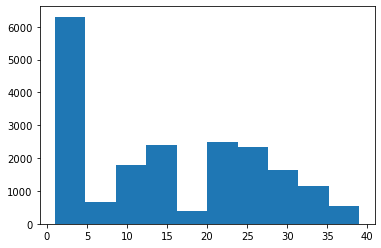

In [91]:
plt.hist(to_plot);

In [79]:
counter = Counter(to_plot)

In [81]:
perc = {k: v/len(to_plot) for k, v in counter.items()}

In [82]:
perc

{3: 0.03347704793304591,
 12: 0.06893228506213543,
 2: 0.26254121227491756,
 27: 0.07927973624144052,
 20: 0.02454983515090033,
 29: 0.0063403499873193,
 15: 0.09723560740552878,
 25: 0.023484656353030688,
 9: 0.014202383971595232,
 14: 0.010043114379913771,
 22: 0.08917068222165864,
 26: 0.007862033984275933,
 8: 0.006593963986812072,
 5: 0.012072026375855947,
 30: 0.028911995942176007,
 1: 0.0077605883844788235,
 16: 0.006644686786710627,
 33: 0.006949023586101953,
 31: 0.0078113111843773776,
 24: 0.007354805985290388,
 35: 0.0374841491250317,
 7: 0.006847577986304844,
 19: 0.006847577986304844,
 34: 0.007101191985797616,
 23: 0.0062896271874207455,
 18: 0.00715191478569617,
 4: 0.016079127567841744,
 28: 0.040730408318539184,
 17: 0.006036013187927973,
 21: 0.006695409586609181,
 6: 0.007659142784681714,
 13: 0.007101191985797616,
 37: 0.005985290388029419,
 10: 0.006999746386000507,
 39: 0.007253360385493279,
 38: 0.0037534871924930257,
 36: 0.010043114379913771,
 32: 0.00750697438

In [139]:
reb = rebalance(y)

2021-08-23 12:57:29,088 -INFO - 4039939320:4039939320.py:2 - Rebalance dataset
2021-08-23 12:57:29,099 -INFO - 4039939320:4039939320.py:15 - "n/a" count: 130926, labels count: 19715
2021-08-23 12:57:29,162 -INFO - 4039939320:4039939320.py:30 - Rebalanced and shuffled indices: 459586


In [140]:
new_y = y[reb]

In [141]:
len(new_y)

459586

In [142]:
new_to_plot = new_y[new_y != 0]

(array([153403.,  34374.,  34796.,  33214.,  34574.,  33136.,  33529.,
         33829.,  34024.,  34707.]),
 array([ 0. ,  3.9,  7.8, 11.7, 15.6, 19.5, 23.4, 27.3, 31.2, 35.1, 39. ]),
 <BarContainer object of 10 artists>)

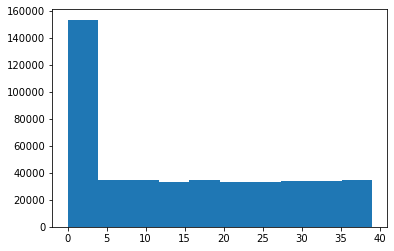

In [143]:
plt.hist(new_y)

(array([31036., 34525., 34240., 33706., 25928., 33136., 33529., 33829.,
        34024., 34707.]),
 array([ 1. ,  4.8,  8.6, 12.4, 16.2, 20. , 23.8, 27.6, 31.4, 35.2, 39. ]),
 <BarContainer object of 10 artists>)

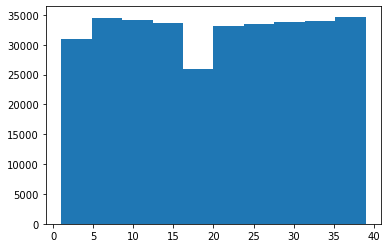

In [144]:
plt.hist(new_to_plot)

In [101]:
cnt  = Counter(new_y)

In [102]:
prc = {k: v/len(new_y) for k, v in cnt.items()}

In [103]:
prc

{0: 0.1543867675896981,
 21: 0.021947103847818318,
 7: 0.021968329286742708,
 16: 0.02193531193730477,
 9: 0.021791450629039467,
 15: 0.020344583209026944,
 25: 0.021838618271093665,
 17: 0.02203082641246452,
 28: 0.02177847952747456,
 36: 0.021947103847818318,
 26: 0.02193295355520206,
 38: 0.021989554725667097,
 12: 0.02083276830428789,
 37: 0.021984837961461678,
 27: 0.020273831745945645,
 5: 0.021890502677353284,
 20: 0.02168768181652023,
 3: 0.021791450629039467,
 14: 0.021947103847818318,
 10: 0.021968329286742708,
 24: 0.02188578591314786,
 18: 0.021947103847818318,
 22: 0.02073017868282001,
 4: 0.02205441023349162,
 35: 0.02178555467378269,
 34: 0.02195653737622916,
 11: 0.022046155896132135,
 19: 0.021968329286742708,
 33: 0.02197068766884542,
 8: 0.021921161644688512,
 32: 0.021989554725667097,
 30: 0.021508444776714278,
 13: 0.02195653737622916,
 1: 0.022010780164591487,
 29: 0.021962433331485932,
 39: 0.021921161644688512,
 6: 0.021901115396815475,
 31: 0.021973046050948127

In [38]:
ds_files = [f'dataset/df/{fn}.parquet' for fn in DATASET_NAMES]

In [39]:
train_names= DATASET_NAMES[:100]
test_names = DATASET_NAMES[100:]

In [146]:
class JDNDataset(Dataset):

    def __init__(self, datasets_list: list = None, rebalance_and_shuffle: bool = False):

        super(JDNDataset, self).__init__()
        self.rebalance_and_suffle = rebalance_and_shuffle

        with open('dataset/classes.txt', 'r') as f:
            lines = f.readlines()
            self.classes_dict = {v.strip(): i for i, v in enumerate(lines)}
            self.classes_reverse_dict = {i: v.strip() for i, v in enumerate(lines)}

        if datasets_list is None:
            logger.info('Will use all available datasets')
            ds_files = glob('dataset/df/*.parquet')
#             ds_files = [(fn, 'dataset/annotations/' + re.split(r'[/\\]', re.sub(r'\.parquet$', '', fn))[-1] + '.txt')
#                         for fn in ds_files]
        else:
            ds_files = [(f'dataset/df/{fn}.parquet') for fn in datasets_list]
             

        # display(ds_files)

        df_list = []

        logger.setLevel(logging.ERROR)
        with trange(len(ds_files)) as bar:
            for df_file_path in ds_files:
                if not os.path.exists(df_file_path):
                    logger.error(f'File: {df_file_path} does not extst')
                else:
                    bar.set_postfix_str(f'{df_file_path}')
                    df = pd.read_parquet(df_file_path)
                    df['label_text'] = df.attributes.apply(lambda x: x.get('data-label') if x is not None else 'n/a').fillna('n/a')
                    df = build_features(df)
                    df = assign_labels(
                        df=df)
                    df_list.append(df)
                bar.update(1)

        logger.setLevel(logging.DEBUG)

        self.df = pd.concat(df_list)
        logger.info(f'self.df.shape: {self.df.shape}')

        logger.info('Check for duplicates...')
        if self.df.element_id.nunique() != self.df.shape[0]:
            logger.fatal('There are duplicates in the dataset')
            raise Exception('There are duplicates in the dataset')
        logger.info('Check for duplicates is OK')
        #here a, input features
        print(self.df.columns) 
        self.X, self.y = collect_dataset(self.df)

        if self.rebalance_and_suffle:
            self.indices = np.array(rebalance(self.y))
        else:
            self.indices = np.array([i for i in range(len(self.y))])

    def __getitem__(self, idx):
        return self.X[self.indices[idx]], self.y[self.indices[idx]]

    def __len__(self):
        return self.indices.shape[0]


logger.info("dataset module is loaded...")

2021-08-27 17:30:48,127 -INFO - 2940607699:2940607699.py:67 - dataset module is loaded...


#### EDA input a

In [147]:
ds = JDNDataset(datasets_list=[f'mui-site{x}' for x in range(1, 101)], rebalance_and_shuffle=True)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/1436 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1226 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1749 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1136 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1854 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1083 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1662 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1235 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1439 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1362 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/2134 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/2806 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1451 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1397 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1563 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1172 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1383 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1261 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/2091 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1168 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1487 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1653 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1534 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1561 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1608 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1558 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/782 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1594 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1380 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1719 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1546 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1444 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1174 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1180 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1156 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1614 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1837 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1772 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1773 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1248 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1307 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1281 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1789 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1408 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1806 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1159 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1417 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1474 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1202 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1718 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1661 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1950 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1544 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1463 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1520 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1467 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1103 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1295 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1893 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1598 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1309 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1820 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1662 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1661 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1733 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1792 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1271 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1373 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1388 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1359 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1470 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1601 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1499 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/2609 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1447 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1551 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1216 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1520 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1032 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1211 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1674 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1478 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/2031 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1345 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1192 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1892 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1476 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1485 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1341 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/861 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/695 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1380 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1648 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/2051 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1973 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1835 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1059 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1480 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1489 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}


  0%|          | 0/1449 [00:00<?, ?it/s]

{0: 'n/a', 1: 'backdrop', 2: 'icon', 3: 'link', 4: 'avatar', 5: 'paper', 6: 'bottom-navigation', 7: 'menu', 8: 'stepper', 9: 'progress', 10: 'box', 11: 'dialog', 12: 'button', 13: 'card', 14: 'switch', 15: 'typography', 16: 'container', 17: 'table', 18: 'popper', 19: 'breadcrumbs', 20: 'list', 21: 'alert', 22: 'chip', 23: 'select', 24: 'textarea-autosize', 25: 'accordion', 26: 'text-field', 27: 'radio', 28: 'checkbox', 29: 'drawer', 30: 'grid', 31: 'popover', 32: 'snackbar', 33: 'radiogroup', 34: 'slider', 35: 'divider', 36: 'badge', 37: 'app-bar', 38: 'button-group', 39: 'tabs'}
2021-08-27 17:35:21,529 -INFO - 2940607699:2940607699.py:44 - self.df.shape: (150641, 28)
2021-08-27 17:35:21,529 -INFO - 2940607699:2940607699.py:46 - Check for duplicates...
2021-08-27 17:35:21,579 -INFO - 2940607699:2940607699.py:50 - Check for duplicates is OK
Index(['attributes', 'displayed', 'element_id', 'height', 'onmouseenter',
       'onmouseover', 'parent_id', 'style', 'tag_name', 'text', 'width', '

  0%|          | 0/150641 [00:00<?, ?it/s]

2021-08-27 17:35:33,744 -INFO - 131696726:131696726.py:9 - used column: attributes_parent


  0%|          | 0/150641 [00:00<?, ?it/s]

2021-08-27 17:35:47,730 -INFO - 131696726:131696726.py:9 - used column: attributes_upsib


  0%|          | 0/150641 [00:00<?, ?it/s]

2021-08-27 17:36:00,151 -INFO - 131696726:131696726.py:9 - used column: attributes_dnsib


  0%|          | 0/150641 [00:00<?, ?it/s]

2021-08-27 17:36:11,215 -INFO - 1199642344:1199642344.py:41 - attributes_sm: (150641, 74)
2021-08-27 17:36:11,217 -INFO - 2973949930:2973949930.py:8 - used column: attributes
2021-08-27 17:36:11,217 -INFO - 2973949930:2973949930.py:11 - TfIdfVectorizer for class attribute exists. Loaging...
2021-08-27 17:36:12,026 -INFO - 2973949930:2973949930.py:8 - used column: attributes_parent
2021-08-27 17:36:12,026 -INFO - 2973949930:2973949930.py:11 - TfIdfVectorizer for class attribute exists. Loaging...
2021-08-27 17:36:12,741 -INFO - 2973949930:2973949930.py:8 - used column: attributes_upsib
2021-08-27 17:36:12,749 -INFO - 2973949930:2973949930.py:11 - TfIdfVectorizer for class attribute exists. Loaging...
2021-08-27 17:36:13,238 -INFO - 2973949930:2973949930.py:8 - used column: attributes_dnsib
2021-08-27 17:36:13,240 -INFO - 2973949930:2973949930.py:11 - TfIdfVectorizer for class attribute exists. Loaging...
2021-08-27 17:36:13,781 -INFO - 1199642344:1199642344.py:48 - class_sm: (150641, 14

In [148]:
tree_dict = {e[1]:e[0] for e in ds.df[['parent_id', 'element_id']].values}

In [149]:
ds.df[ds.df['tag_name']=='A'].parent_id.map(tree_dict)

851     1648614885533317443668626490
1056    0377273233533317410400121215
834     5105300421533317441718946895
1348    8039578431533317466507419099
841     7768605462533317447933653652
                    ...             
131     6969778779547309430101976162
1097    9714368784547309434955021315
806     9714368784547309434955021315
844     4974828636547309442079937312
1169    9714368784547309434955021315
Name: parent_id, Length: 804, dtype: object

In [150]:
df_a = ds.df[ds.df['tag_name']=='A'].copy()

In [151]:
df_a['grandpa'] = df_a.parent_id.map(tree_dict)

In [152]:
df_a['grandgrandpa'] = df_a.grandpa.map(tree_dict)

In [166]:
df_i['label'].value_counts()

0    3556
Name: label, dtype: int64

In [153]:
df_i = ds.df[ds.df['tag_name']=='INPUT'].copy()

In [154]:
df_i['grandpa'] = df_i.parent_id.map(tree_dict)

In [155]:
df_i['grandgrandpa'] = df_i.grandpa.map(tree_dict)

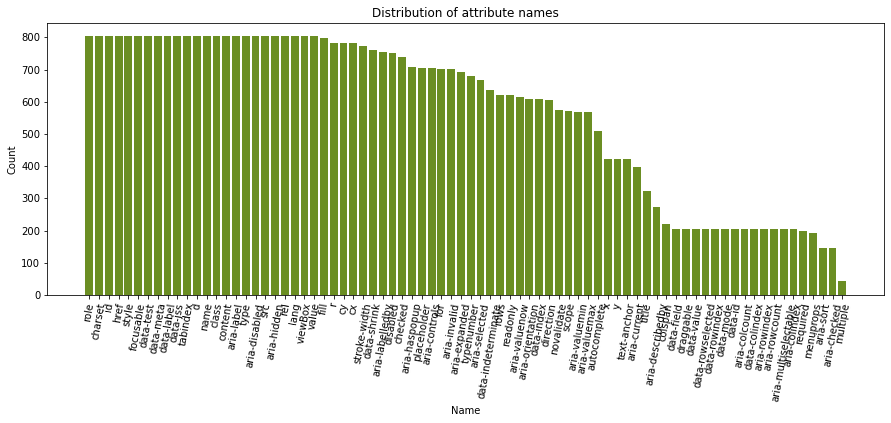

In [156]:
plot_attr_names(df_a, 'attributes')

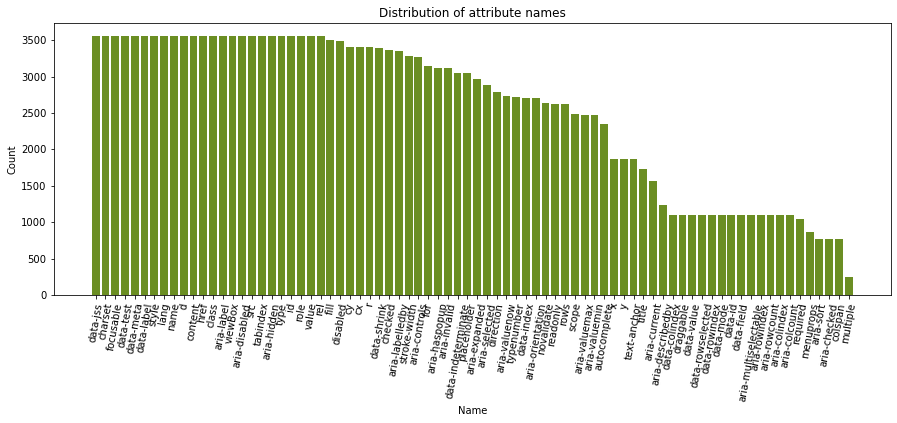

In [119]:
plot_attr_names(df_i, 'attributes')

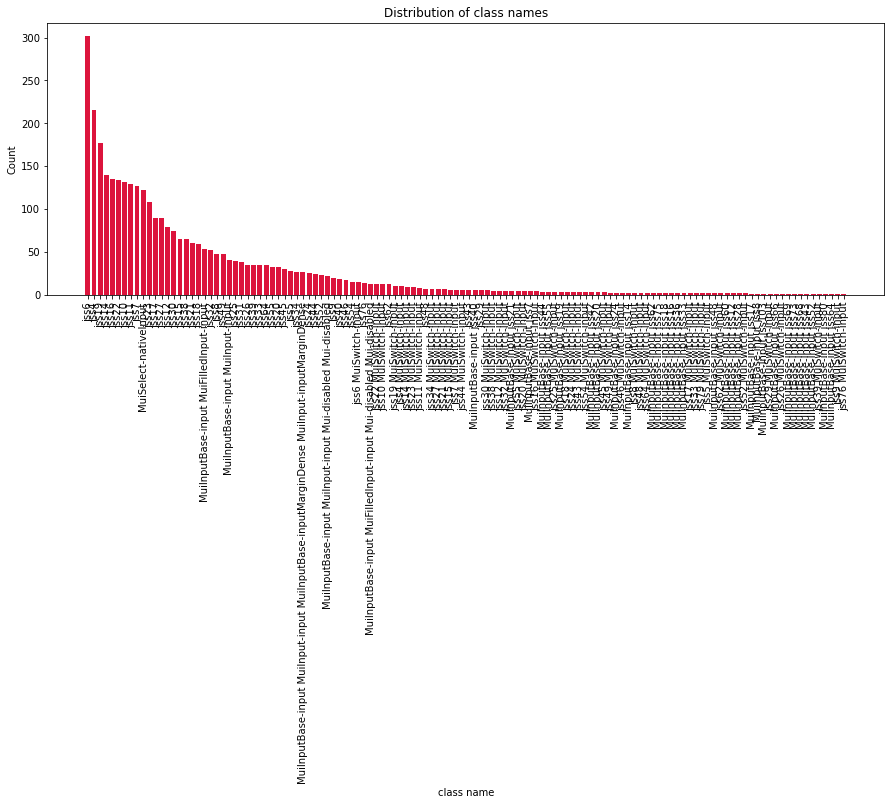

In [127]:
plot_class_names(df_i, 'attributes', 'class', thresh=0)

In [158]:
df_i

,attributes,displayed,element_id,height,onmouseenter,onmouseover,parent_id,style,tag_name,text,...,sum_children_widths,sum_children_hights,children_tags,num_followers,upper_sibling,lower_sibling,siblings,label,grandpa,grandgrandpa
638,"{'aria-controls': None, 'aria-describedby': No...",False,0042575764533317433567141096,42.0,None,None,6761137163533317435616397787,"[align-content, align-items, align-self, align...",INPUT,,...,0.0,0.0,,0,None,7228034643533317434209190816,"(None, 7228034643533317434209190816)",0,5673169454533317438210101426,8969650173533317430124199225
607,"{'aria-controls': None, 'aria-describedby': No...",False,0209420585533317435799499534,42.0,None,None,0595285178533317431719580211,"[align-content, align-items, align-self, align...",INPUT,,...,0.0,0.0,,0,None,0793123866533317439167981643,"(None, 0793123866533317439167981643)",0,1407795278533317433031727326,2432863147533317433603700544
1017,"{'aria-controls': None, 'aria-describedby': No...",False,0311835229533317452294748048,42.0,None,None,2970210013533317450715467879,"[align-content, align-items, align-self, align...",INPUT,,...,0.0,0.0,,0,None,5938647562533317454070254315,"(None, 5938647562533317454070254315)",0,3440763659533317456695860704,4835724886533317458842586900
985,"{'aria-controls': None, 'aria-describedby': No...",False,1778410160533317450038192110,42.0,None,None,2973233673533317459385633353,"[align-content, align-items, align-self, align...",INPUT,,...,0.0,0.0,,0,None,9879222892533317455215820640,"(None, 9879222892533317455215820640)",0,2301243949533317453571015176,6633010527533317457671609393
1110,"{'aria-controls': None, 'aria-describedby': No...",True,1824512062533317459860754046,38.0,None,None,3700715749533317458357672501,"[align-content, align-items, align-self, align...",INPUT,,...,0.0,0.0,,0,None,4209923414533317459075747132,"(None, 4209923414533317459075747132)",0,3639700024533317453610867704,6802870184533317453736766050
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
302,"{'aria-controls': None, 'aria-disabled': None,...",True,6175053654547309441653538601,38.0,None,None,9297996035547309440115448558,"[align-content, align-items, align-self, align...",INPUT,,...,0.0,0.0,,0,None,9465114204547309442349685301,"(None, 9465114204547309442349685301)",0,1379090076547309446637184932,4386621128547309447880815373
295,"{'aria-controls': None, 'aria-disabled': None,...",True,8806134133547309448368934154,21.0,None,None,8270412493547309449186690043,"[align-content, align-items, align-self, align...",INPUT,,...,0.0,0.0,,0,6387722022547309449825772881,9419709176547309444168552521,"(6387722022547309449825772881, 941970917654730...",0,0311198829547309440860902974,6705978203547309448277713458
129,"{'aria-controls': None, 'aria-disabled': None,...",False,8905989019547309431378295926,32.0,None,None,3640931601547309436726564873,"[align-content, align-items, align-self, align...",INPUT,,...,0.0,0.0,,0,None,None,"(None, None)",0,6999302041547309438562748468,7538535001547309434366677589
768,"{'aria-controls': None, 'aria-disabled': None,...",True,9212682912547309440608077723,42.0,None,None,0686561869547309444554047531,"[align-content, align-items, align-self, align...",INPUT,,...,0.0,0.0,,0,None,8348753684547309448854748273,"(None, 8348753684547309448854748273)",0,7547063288547309440372205599,1655610848547309444038250706


In [159]:
df_a.label.unique()

array([ 3, 22])

In [163]:
df_a.label.value_counts()

3     660
22    144
Name: label, dtype: int64

In [161]:
df_a[df_a['label'] != 0]

,attributes,displayed,element_id,height,onmouseenter,onmouseover,parent_id,style,tag_name,text,...,sum_children_widths,sum_children_hights,children_tags,num_followers,upper_sibling,lower_sibling,siblings,label,grandpa,grandgrandpa
851,"{'aria-controls': None, 'aria-describedby': No...",False,0014036779533317445643714048,17.0,None,None,0474982838533317449182819998,"[align-content, align-items, align-self, align...",A,Material-UI,...,0.00000,0.0,,0,None,None,"(None, None)",3,1648614885533317443668626490,7844493833533317445158472713
1056,"{'aria-controls': None, 'aria-describedby': No...",False,0396503120533317455540508013,16.0,None,None,6135746810533317454838883187,"[align-content, align-items, align-self, align...",A,"variant=""body2""",...,0.00000,0.0,,0,None,None,"(None, None)",3,0377273233533317410400121215,6895360441533317410126424312
834,"{'aria-controls': None, 'aria-describedby': No...",False,0900906475533317440859111882,17.0,None,None,4475380140533317442697166304,"[align-content, align-items, align-self, align...",A,Core,...,0.00000,0.0,,0,None,None,"(None, None)",3,5105300421533317441718946895,3840109995533317445219737000
1348,"{'aria-controls': None, 'aria-describedby': No...",True,4468860727533317461593552776,17.0,None,None,7875177913533317466809843726,"[align-content, align-items, align-self, align...",A,Core,...,24.00000,24.0,svg,2,None,None,"(None, None)",3,8039578431533317466507419099,3663440674533317466322984540
841,"{'aria-controls': None, 'aria-describedby': No...",False,6367599313533317440109552936,17.0,None,None,8715457706533317440319051873,"[align-content, align-items, align-self, align...",A,Material-UI,...,0.00000,0.0,,0,None,None,"(None, None)",3,7768605462533317447933653652,3143352750533317440049543747
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
131,"{'aria-controls': None, 'aria-disabled': None,...",False,4657690697547309434123532628,16.0,None,None,6782981665547309439982406428,"[align-content, align-items, align-self, align...",A,"variant=""body2""",...,0.00000,0.0,,0,None,None,"(None, None)",3,6969778779547309430101976162,9714368784547309434955021315
1097,"{'aria-controls': None, 'aria-disabled': None,...",True,5396046126547309448373369357,24.0,None,None,6969778779547309430101976162,"[align-content, align-items, align-self, align...",A,veniam ad,...,77.34375,18.0,span,1,8459292635547309441055853660,5663144686547309449126207449,"(8459292635547309441055853660, 566314468654730...",22,9714368784547309434955021315,0118040855547309436757508088
806,"{'aria-controls': None, 'aria-disabled': None,...",True,5475309018547309440835342534,24.0,None,None,6969778779547309430101976162,"[align-content, align-items, align-self, align...",A,nulla ad,...,62.75000,18.0,span,1,9507197396547309447627763925,0500500128547309446874669776,"(9507197396547309447627763925, 050050012854730...",22,9714368784547309434955021315,0118040855547309436757508088
844,"{'aria-controls': None, 'aria-disabled': None,...",True,6535441561547309447469683419,17.0,None,None,5954815303547309445139573454,"[align-content, align-items, align-self, align...",A,Core,...,0.00000,0.0,,0,None,None,"(None, None)",3,4974828636547309442079937312,4348678152547309446672470385


In [137]:
# attr_class_series = df_i['attributes'].apply(lambda x: None if type(x) is not dict else x.get('class')).fillna('')

attr_class_series = df_i[df_i.label != 0]\
    .attributes.apply(lambda x: None if type(x) is not dict else x.get('class'))\
    .fillna('')

# class_cv = CountVectorizer()
# class_cv.fit(attr_class_series.values)
# # filter out class names:  length is at least 2 characters and only letters
# vocabulary = sorted([v for v in class_cv.vocabulary_.keys() if re.match(r'^[a-z][a-z]+$', v)])


# attr_class_series = df_i['attributes'].apply(lambda x: None if type(x) is not dict else x.get('class')).fillna('')
# model = TfidfVectorizer(vocabulary=vocabulary)  # CountVectorizer?
# model.fit(attr_class_series.values)
# logger.info(f'Saving {model_file_path}, vocabulary length: {len(vocabulary)}')
# with open(model_file_path, 'wb') as f:
#     pickle.dump(model, f)
#     f.flush()

# model.transform(attr_class_series.values)

In [138]:
attr_class_series

Series([], Name: attributes, dtype: object)

In [72]:
def accuracy(df: pd.DataFrame, y_true: str = 'y_true_label', is_hidden: str = 'is_hidden',
             y_pred: str = 'y_pred_label', verbose: bool = True, dummy: str = 'n/a'):
    """
        Calculates accuracy on all elements which are not "n/a"
        Parameters: y_true, y_pred are column names
    """
    total_cnt = df.shape[0]
    df = df[[y_true, y_pred]][((df[y_true] != dummy) | (df[y_pred] != dummy)) & (df[is_hidden] == 0)]

    n = df.shape[0]

    if n != 0:
        true_cnt = df[df[y_true] == df[y_pred]].shape[0]
        acc = true_cnt / n
        if verbose:
            ipython_displpay(HTML(f'<H2>Accuracy: {acc} <H2>'))
            logger.info(
                f'Accuracy:  {true_cnt}/{n} = {acc}, for {total_cnt} elements')
        return acc

    else:
        ipython_displpay('<h1>Exception: No predictions<h1>')
        logger.info('<h1>Exception: No predictions<h1>')
        raise Exception('No predictions')

    return None


In [42]:
import os, gc
import torch
from torch.utils.data import DataLoader
from utils.model import JDIModel
from multiprocessing import freeze_support
from terminaltables import DoubleTable

In [43]:
BATCH_SIZE = 256
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
logger.info(f'device: {DEVICE}')


2021-08-24 10:55:41,984 -INFO - 563722715:563722715.py:3 - device: cpu


In [44]:
def evaluate(model: JDIModel, dataset: JDNDataset) -> pd.DataFrame:

    model.eval()
    with torch.no_grad():

        dataloader = DataLoader(dataset, shuffle=False, batch_size=1, pin_memory=True)
        results = []

        with trange(len(dataloader), desc='Evaluating:') as bar:
            with torch.no_grad():
                for x, y in dataloader:
                    y_pred = torch.round(torch.nn.Softmax(dim=1)(model(x.to(DEVICE)).to('cpu'))).detach().numpy()
                    y_pred = y_pred[0].argmax()
                    y = y.item()

                    results.append({
                        'y_true': y,
                        'y_pred': y_pred,
                        'y_true_label': dataset.classes_reverse_dict[y],
                        'y_pred_label': dataset.classes_reverse_dict[y_pred]
                    })
                    bar.update(1)

    results_df = pd.DataFrame(results)
    results_df['is_hidden'] = dataset.df.is_hidden.values
    return accuracy(results_df)

In [45]:
import sys
from io import StringIO
from IPython import get_ipython


class IpyExit(SystemExit):
    """Exit Exception for IPython.

    Exception temporarily redirects stderr to buffer.
    """
    def __init__(self):
        # print("exiting")  # optionally print some message to stdout, too
        # ... or do other stuff before exit
        sys.stderr = StringIO()

    def __del__(self):
        sys.stderr.close()
        sys.stderr = sys.__stderr__  # restore from backup


def ipy_exit():
    raise IpyExit




In [46]:
%%time
freeze_support()

train_dataset = JDNDataset(datasets_list=train_names, rebalance_and_shuffle=True)
    # train_dataset = JDNDataset(datasets_list=None, rebalance_and_suffle=True)
test_dataset = JDNDataset(datasets_list=test_names, rebalance_and_shuffle=False)

logger.info(f'Train dataset shape:  {train_dataset.X.shape}; Test dataset shape: {test_dataset.X.shape}')

train_dataloader = DataLoader(train_dataset,
                              batch_size=BATCH_SIZE,
                              shuffle=True,
                              pin_memory=True,
                              drop_last=True,
                              num_workers=0)

IN_FEATURES = next(iter(train_dataloader))[0][0].shape[0]
OUT_FEATURES = len(train_dataset.classes_dict)

if os.path.exists('model/model.pth'):
    print('WARNING: load saved model weights')
    model = torch.load('model/model.pth', map_location='cpu').to(DEVICE)
    best_accuracy = evaluate(model=model, dataset=test_dataset)
else:
    print('WARNING: Create brand new model')
    model = JDIModel(in_features=IN_FEATURES, out_features=OUT_FEATURES)
    best_accuracy = 0.0

logger.info(f'START TRAINING THE MODEL WITH THE BEST ACCURACY: {best_accuracy}')

# just for test purpose:
# model = JDIModel(in_features=IN_FEATURES, out_features=OUT_FEATURES)

train_metrics = []
lambda_input = .01
lambda_hidden = .0001
gc.collect()

criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

NUM_BATCHES = len(train_dataloader)
NUM_EPOCS = 90
EARLY_STOPPING_THRESHOLD = 20
early_stopping_steps = EARLY_STOPPING_THRESHOLD

for epoch in range(NUM_EPOCS):

    model.train()
    model.to(DEVICE)

    cumulative_loss = 0.0
    cumulative_main_loss = 0.0

    with trange(NUM_BATCHES) as bar:

        for x, y in train_dataloader:
            y_hat = model(x.to(DEVICE))

            optimizer.zero_grad()

            main_loss = criterion(y_hat, y.long().to(DEVICE))

            loss = main_loss   # \ noqa
            # + torch.abs(model.input_layer.weight).sum()*lambda_input \ noqa
            # + (model.hidden1.weight**2).sum()*lambda_hidden \ noqa
            # + (model.hidden2.weight**2).sum()*lambda_hidden noqa

            loss.backward()
            optimizer.step()
            cumulative_loss += loss.item()
            cumulative_main_loss += main_loss.item()
            bar.set_description(f"Epoch: {epoch}, {round(cumulative_loss,5)}, {round(main_loss.item(),5)}, {round(loss.item(),5)}") # noqa
            bar.update(1)

        bar.update(1)

    # evaluate model
    # torch.save(model, f'model/model-{epoch}.pth')
    early_stopping_steps -= 1
    test_accuracy = evaluate(model=model, dataset=test_dataset)
    if test_accuracy > best_accuracy:
        best_accuracy = test_accuracy
        logger.info(f'SAVING MODEL WITH THE BEST ACCUCACY: {best_accuracy}')
        torch.save(model, 'model/model.pth')
        early_stopping_steps = EARLY_STOPPING_THRESHOLD

    train_metrics.append({
        'epoch': epoch,
        'mean(loss)': cumulative_loss / NUM_BATCHES,
        # 'loss': cumulative_main_loss / NUM_BATCHES,
        'accuracy(test)': test_accuracy
    })

    # report metrics
    print()
    # table_data = [['epoch', 'mean(loss)', 'loss', 'accuracy(test)']]
    table_data = [['epoch', 'mean(loss)', 'accuracy(test)']]
    for r in train_metrics:
        # table_data.append([r['epoch'], r['mean(loss)'], r['loss'], r['accuracy(test)']])
        table_data.append([r['epoch'], r['mean(loss)'], r['accuracy(test)']])

    print(DoubleTable(table_data=table_data).table)
    print(f'Best accuracy: {best_accuracy}, attempts left: {early_stopping_steps}')

    if early_stopping_steps <= 0:
        logger.info('EARLY STOPPING')
#         exit(0)
#         exit(keep_kernel=True)
        if get_ipython():    # ...run with IPython
            exit = ipy_exit  # rebind to custom exit
        else:
            exit = exit

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/1436 [00:00<?, ?it/s]

  0%|          | 0/1226 [00:00<?, ?it/s]

  0%|          | 0/1749 [00:00<?, ?it/s]

  0%|          | 0/1136 [00:00<?, ?it/s]

  0%|          | 0/1854 [00:00<?, ?it/s]

  0%|          | 0/1083 [00:00<?, ?it/s]

  0%|          | 0/1662 [00:00<?, ?it/s]

  0%|          | 0/1235 [00:00<?, ?it/s]

  0%|          | 0/1439 [00:00<?, ?it/s]

  0%|          | 0/1362 [00:00<?, ?it/s]

  0%|          | 0/2134 [00:00<?, ?it/s]

  0%|          | 0/2806 [00:00<?, ?it/s]

  0%|          | 0/1451 [00:00<?, ?it/s]

  0%|          | 0/1397 [00:00<?, ?it/s]

  0%|          | 0/1563 [00:00<?, ?it/s]

  0%|          | 0/1172 [00:00<?, ?it/s]

  0%|          | 0/1383 [00:00<?, ?it/s]

  0%|          | 0/1261 [00:00<?, ?it/s]

  0%|          | 0/2091 [00:00<?, ?it/s]

  0%|          | 0/1168 [00:00<?, ?it/s]

  0%|          | 0/1487 [00:00<?, ?it/s]

  0%|          | 0/1653 [00:00<?, ?it/s]

  0%|          | 0/1534 [00:00<?, ?it/s]

  0%|          | 0/1561 [00:00<?, ?it/s]

  0%|          | 0/1608 [00:00<?, ?it/s]

  0%|          | 0/1558 [00:00<?, ?it/s]

  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/1594 [00:00<?, ?it/s]

  0%|          | 0/1380 [00:00<?, ?it/s]

  0%|          | 0/1719 [00:00<?, ?it/s]

  0%|          | 0/1546 [00:00<?, ?it/s]

  0%|          | 0/1444 [00:00<?, ?it/s]

  0%|          | 0/1174 [00:00<?, ?it/s]

  0%|          | 0/1180 [00:00<?, ?it/s]

  0%|          | 0/1156 [00:00<?, ?it/s]

  0%|          | 0/1614 [00:00<?, ?it/s]

  0%|          | 0/1837 [00:00<?, ?it/s]

  0%|          | 0/1772 [00:00<?, ?it/s]

  0%|          | 0/1773 [00:00<?, ?it/s]

  0%|          | 0/1248 [00:00<?, ?it/s]

  0%|          | 0/1307 [00:00<?, ?it/s]

  0%|          | 0/1281 [00:00<?, ?it/s]

  0%|          | 0/1789 [00:00<?, ?it/s]

  0%|          | 0/1408 [00:00<?, ?it/s]

  0%|          | 0/1806 [00:00<?, ?it/s]

  0%|          | 0/1159 [00:00<?, ?it/s]

  0%|          | 0/1417 [00:00<?, ?it/s]

  0%|          | 0/1474 [00:00<?, ?it/s]

  0%|          | 0/1202 [00:00<?, ?it/s]

  0%|          | 0/1718 [00:00<?, ?it/s]

  0%|          | 0/1661 [00:00<?, ?it/s]

  0%|          | 0/1950 [00:00<?, ?it/s]

  0%|          | 0/1544 [00:00<?, ?it/s]

  0%|          | 0/1463 [00:00<?, ?it/s]

  0%|          | 0/1520 [00:00<?, ?it/s]

  0%|          | 0/1467 [00:00<?, ?it/s]

  0%|          | 0/1103 [00:00<?, ?it/s]

  0%|          | 0/1295 [00:00<?, ?it/s]

  0%|          | 0/1893 [00:00<?, ?it/s]

  0%|          | 0/1598 [00:00<?, ?it/s]

  0%|          | 0/1309 [00:00<?, ?it/s]

  0%|          | 0/1820 [00:00<?, ?it/s]

  0%|          | 0/1662 [00:00<?, ?it/s]

  0%|          | 0/1661 [00:00<?, ?it/s]

  0%|          | 0/1733 [00:00<?, ?it/s]

  0%|          | 0/1792 [00:00<?, ?it/s]

  0%|          | 0/1271 [00:00<?, ?it/s]

  0%|          | 0/1373 [00:00<?, ?it/s]

  0%|          | 0/1388 [00:00<?, ?it/s]

  0%|          | 0/1359 [00:00<?, ?it/s]

  0%|          | 0/1470 [00:00<?, ?it/s]

  0%|          | 0/1601 [00:00<?, ?it/s]

  0%|          | 0/1499 [00:00<?, ?it/s]

  0%|          | 0/2609 [00:00<?, ?it/s]

  0%|          | 0/1447 [00:00<?, ?it/s]

  0%|          | 0/1551 [00:00<?, ?it/s]

  0%|          | 0/1216 [00:00<?, ?it/s]

  0%|          | 0/1520 [00:00<?, ?it/s]

  0%|          | 0/1032 [00:00<?, ?it/s]

  0%|          | 0/1211 [00:00<?, ?it/s]

  0%|          | 0/1674 [00:00<?, ?it/s]

  0%|          | 0/1478 [00:00<?, ?it/s]

  0%|          | 0/2031 [00:00<?, ?it/s]

  0%|          | 0/1345 [00:00<?, ?it/s]

  0%|          | 0/1192 [00:00<?, ?it/s]

  0%|          | 0/1892 [00:00<?, ?it/s]

  0%|          | 0/1476 [00:00<?, ?it/s]

  0%|          | 0/1485 [00:00<?, ?it/s]

  0%|          | 0/1341 [00:00<?, ?it/s]

  0%|          | 0/861 [00:00<?, ?it/s]

  0%|          | 0/695 [00:00<?, ?it/s]

  0%|          | 0/1380 [00:00<?, ?it/s]

  0%|          | 0/1648 [00:00<?, ?it/s]

  0%|          | 0/2051 [00:00<?, ?it/s]

  0%|          | 0/1973 [00:00<?, ?it/s]

  0%|          | 0/1835 [00:00<?, ?it/s]

  0%|          | 0/1059 [00:00<?, ?it/s]

  0%|          | 0/1480 [00:00<?, ?it/s]

  0%|          | 0/1489 [00:00<?, ?it/s]

  0%|          | 0/1449 [00:00<?, ?it/s]

2021-08-24 10:59:54,992 -INFO - 2600153284:2600153284.py:44 - self.df.shape: (150641, 28)
2021-08-24 10:59:54,993 -INFO - 2600153284:2600153284.py:46 - Check for duplicates...
2021-08-24 10:59:55,039 -INFO - 2600153284:2600153284.py:50 - Check for duplicates is OK
2021-08-24 10:59:55,968 -INFO - 1238942435:1238942435.py:6 - used column: tag_name
2021-08-24 10:59:55,969 -INFO - 1238942435:1238942435.py:13 - Building OHE for "tag_name"
2021-08-24 10:59:56,099 -INFO - 1238942435:1238942435.py:17 - OHE "tag_name" categories: [['A', 'BUTTON', 'DIV', 'H4', 'H6', 'HEADER', 'HR', 'LI', 'NAV', 'P', 'SPAN', 'TABLE', 'TEXTAREA', 'UL', 'svg']]
2021-08-24 10:59:56,101 -INFO - 1238942435:1238942435.py:20 - Saving model/ohe_tag_name.pkl
2021-08-24 10:59:56,159 -INFO - 1238942435:1238942435.py:6 - used column: tag_name_parent
2021-08-24 10:59:56,160 -INFO - 1238942435:1238942435.py:9 - loading model/ohe_tag_name.pkl
2021-08-24 10:59:56,223 -INFO - 1238942435:1238942435.py:6 - used column: tag_name_ups

  0%|          | 0/150641 [00:00<?, ?it/s]

2021-08-24 11:00:07,851 -INFO - 131696726:131696726.py:9 - used column: attributes_parent


  0%|          | 0/150641 [00:00<?, ?it/s]

2021-08-24 11:00:18,727 -INFO - 131696726:131696726.py:9 - used column: attributes_upsib


  0%|          | 0/150641 [00:00<?, ?it/s]

2021-08-24 11:00:29,200 -INFO - 131696726:131696726.py:9 - used column: attributes_dnsib


  0%|          | 0/150641 [00:00<?, ?it/s]

2021-08-24 11:00:39,811 -INFO - 1199642344:1199642344.py:41 - attributes_sm: (150641, 74)
2021-08-24 11:00:39,812 -INFO - 2973949930:2973949930.py:8 - used column: attributes
2021-08-24 11:00:39,813 -INFO - 2973949930:2973949930.py:17 - TfIdfVectorizer for class attribute does not exist. Build the one.
2021-08-24 11:00:39,814 -INFO - 2973949930:2973949930.py:21 - Extract useful attr_class features, 'attributes' column will be used
2021-08-24 11:00:39,972 -INFO - 2973949930:2973949930.py:31 - Column ["attributes"] used for tfidf
2021-08-24 11:00:40,708 -INFO - 2973949930:2973949930.py:35 - Saving model/tfidf_attr_class.pkl, vocabulary length: 148
2021-08-24 11:00:41,325 -INFO - 2973949930:2973949930.py:8 - used column: attributes_parent
2021-08-24 11:00:41,327 -INFO - 2973949930:2973949930.py:11 - TfIdfVectorizer for class attribute exists. Loaging...
2021-08-24 11:00:42,048 -INFO - 2973949930:2973949930.py:8 - used column: attributes_upsib
2021-08-24 11:00:42,049 -INFO - 2973949930:297

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/1619 [00:00<?, ?it/s]

  0%|          | 0/2006 [00:00<?, ?it/s]

  0%|          | 0/1153 [00:00<?, ?it/s]

  0%|          | 0/1234 [00:00<?, ?it/s]

  0%|          | 0/993 [00:00<?, ?it/s]

  0%|          | 0/1162 [00:00<?, ?it/s]

  0%|          | 0/1209 [00:00<?, ?it/s]

  0%|          | 0/1391 [00:00<?, ?it/s]

  0%|          | 0/1280 [00:00<?, ?it/s]

  0%|          | 0/1407 [00:00<?, ?it/s]

  0%|          | 0/1704 [00:00<?, ?it/s]

  0%|          | 0/1476 [00:00<?, ?it/s]

  0%|          | 0/926 [00:00<?, ?it/s]

  0%|          | 0/1253 [00:00<?, ?it/s]

  0%|          | 0/1898 [00:00<?, ?it/s]

  0%|          | 0/2036 [00:00<?, ?it/s]

  0%|          | 0/2048 [00:00<?, ?it/s]

  0%|          | 0/1436 [00:00<?, ?it/s]

  0%|          | 0/1345 [00:00<?, ?it/s]

  0%|          | 0/1855 [00:00<?, ?it/s]

2021-08-24 11:01:35,459 -INFO - 2600153284:2600153284.py:44 - self.df.shape: (29431, 28)
2021-08-24 11:01:35,460 -INFO - 2600153284:2600153284.py:46 - Check for duplicates...
2021-08-24 11:01:35,471 -INFO - 2600153284:2600153284.py:50 - Check for duplicates is OK
2021-08-24 11:01:35,643 -INFO - 1238942435:1238942435.py:6 - used column: tag_name
2021-08-24 11:01:35,645 -INFO - 1238942435:1238942435.py:9 - loading model/ohe_tag_name.pkl
2021-08-24 11:01:35,658 -INFO - 1238942435:1238942435.py:6 - used column: tag_name_parent
2021-08-24 11:01:35,659 -INFO - 1238942435:1238942435.py:9 - loading model/ohe_tag_name.pkl
2021-08-24 11:01:35,670 -INFO - 1238942435:1238942435.py:6 - used column: tag_name_upsib
2021-08-24 11:01:35,671 -INFO - 1238942435:1238942435.py:9 - loading model/ohe_tag_name.pkl
2021-08-24 11:01:35,686 -INFO - 1238942435:1238942435.py:6 - used column: tag_name_dnsib
2021-08-24 11:01:35,687 -INFO - 1238942435:1238942435.py:9 - loading model/ohe_tag_name.pkl
2021-08-24 11:01:

  0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:01:37,951 -INFO - 131696726:131696726.py:9 - used column: attributes_parent


  0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:01:40,140 -INFO - 131696726:131696726.py:9 - used column: attributes_upsib


  0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:01:42,243 -INFO - 131696726:131696726.py:9 - used column: attributes_dnsib


  0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:01:44,340 -INFO - 1199642344:1199642344.py:41 - attributes_sm: (29431, 74)
2021-08-24 11:01:44,341 -INFO - 2973949930:2973949930.py:8 - used column: attributes
2021-08-24 11:01:44,343 -INFO - 2973949930:2973949930.py:11 - TfIdfVectorizer for class attribute exists. Loaging...
2021-08-24 11:01:44,496 -INFO - 2973949930:2973949930.py:8 - used column: attributes_parent
2021-08-24 11:01:44,497 -INFO - 2973949930:2973949930.py:11 - TfIdfVectorizer for class attribute exists. Loaging...
2021-08-24 11:01:44,663 -INFO - 2973949930:2973949930.py:8 - used column: attributes_upsib
2021-08-24 11:01:44,664 -INFO - 2973949930:2973949930.py:11 - TfIdfVectorizer for class attribute exists. Loaging...
2021-08-24 11:01:44,765 -INFO - 2973949930:2973949930.py:8 - used column: attributes_dnsib
2021-08-24 11:01:44,767 -INFO - 2973949930:2973949930.py:11 - TfIdfVectorizer for class attribute exists. Loaging...
2021-08-24 11:01:44,874 -INFO - 1199642344:1199642344.py:48 - class_sm: (29431, 148)

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:02:08,864 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3973/4337 = 0.9160710168319115, for 29431 elements
2021-08-24 11:02:08,869 -INFO - <timed exec>:<timed exec>:83 - SAVING MODEL WITH THE BEST ACCUCACY: 0.9160710168319115

╔═══════╦═════════════════════╦════════════════════╗
║ epoch ║ mean(loss)          ║ accuracy(test)     ║
╠═══════╬═════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662 ║ 0.9160710168319115 ║
╚═══════╩═════════════════════╩════════════════════╝
Best accuracy: 0.9160710168319115, attempts left: 20


  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:02:34,415 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3866/4543 = 0.8509795289456307, for 29431 elements

╔═══════╦══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)           ║ accuracy(test)     ║
╠═══════╬══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662  ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572 ║ 0.8509795289456307 ║
╚═══════╩══════════════════════╩════════════════════╝
Best accuracy: 0.9160710168319115, attempts left: 19


  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:02:59,829 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3889/4199 = 0.9261728983091212, for 29431 elements
2021-08-24 11:02:59,834 -INFO - <timed exec>:<timed exec>:83 - SAVING MODEL WITH THE BEST ACCUCACY: 0.9261728983091212

╔═══════╦══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)           ║ accuracy(test)     ║
╠═══════╬══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662  ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572 ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944 ║ 0.9261728983091212 ║
╚═══════╩══════════════════════╩════════════════════╝
Best accuracy: 0.9261728983091212, attempts left: 20


  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:03:25,132 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3973/4187 = 0.9488894196321949, for 29431 elements
2021-08-24 11:03:25,139 -INFO - <timed exec>:<timed exec>:83 - SAVING MODEL WITH THE BEST ACCUCACY: 0.9488894196321949

╔═══════╦══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)           ║ accuracy(test)     ║
╠═══════╬══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662  ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572 ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944 ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276 ║ 0.9488894196321949 ║
╚═══════╩══════════════════════╩════════════════════╝
Best accuracy: 0.9488894196321949, attempts left: 20


  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:03:50,606 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3964/4132 = 0.9593417231364957, for 29431 elements
2021-08-24 11:03:50,611 -INFO - <timed exec>:<timed exec>:83 - SAVING MODEL WITH THE BEST ACCUCACY: 0.9593417231364957

╔═══════╦══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)           ║ accuracy(test)     ║
╠═══════╬══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662  ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572 ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944 ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276 ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992  ║ 0.9593417231364957 ║
╚═══════╩══════════════════════╩════════════════════╝
Best accuracy: 0.9593417231364957, attempts left: 20


  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:04:18,831 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3955/4255 = 0.9294947121034077, for 29431 elements

╔═══════╦══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)           ║ accuracy(test)     ║
╠═══════╬══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662  ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572 ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944 ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276 ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992  ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597 ║ 0.9294947121034077 ║
╚═══════╩══════════════════════╩════════════════════╝
Best accuracy: 0.9593417231364957, attempts left: 19


  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:04:48,975 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3964/4133 = 0.9591096056133559, for 29431 elements

╔═══════╦══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)           ║ accuracy(test)     ║
╠═══════╬══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662  ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572 ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944 ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276 ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992  ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597 ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697 ║ 0.9591096056133559 ║
╚═══════╩══════════════════════╩════════════════════╝
Best accuracy: 0.9593417231364957, attempts left: 18


  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:05:16,627 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3912/4074 = 0.9602356406480118, for 29431 elements
2021-08-24 11:05:16,632 -INFO - <timed exec>:<timed exec>:83 - SAVING MODEL WITH THE BEST ACCUCACY: 0.9602356406480118

╔═══════╦══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)           ║ accuracy(test)     ║
╠═══════╬══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662  ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572 ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944 ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276 ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992  ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597 ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697 ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364  ║ 0.9602356406480118 ║
╚═══════╩══════════════════════╩════════════════════╝
Best accuracy: 0.9602356406480118, attempts left: 20


  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:05:42,141 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3969/4093 = 0.9697043733203029, for 29431 elements
2021-08-24 11:05:42,147 -INFO - <timed exec>:<timed exec>:83 - SAVING MODEL WITH THE BEST ACCUCACY: 0.9697043733203029

╔═══════╦══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)           ║ accuracy(test)     ║
╠═══════╬══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662  ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572 ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944 ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276 ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992  ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597 ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697 ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364  ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785 ║ 0.9697043733203029 ║
╚═══════╩══════════════════════╩════════════════════╝
Best accuracy: 0.9697043733203029, attempts left: 20


  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:06:07,564 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3968/4124 = 0.962172647914646, for 29431 elements

╔═══════╦══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)           ║ accuracy(test)     ║
╠═══════╬══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662  ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572 ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944 ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276 ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992  ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597 ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697 ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364  ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785 ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063 ║ 0.962172647914646  ║
╚═══════╩══════════════════════╩════════════════════╝
Best accuracy: 0.9697043733203029, attempts left: 19


  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:06:33,003 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3972/4201 = 0.9454891692454177, for 29431 elements

╔═══════╦══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)           ║ accuracy(test)     ║
╠═══════╬══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662  ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572 ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944 ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276 ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992  ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597 ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697 ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364  ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785 ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063 ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015 ║ 0.9454891692454177 ║
╚═══════╩══════════════════════╩════════════════════╝
Best accuracy: 0.9697043733203029, attempts left: 18


  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:06:59,502 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3969/4095 = 0.9692307692307692, for 29431 elements

╔═══════╦══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)           ║ accuracy(test)     ║
╠═══════╬══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662  ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572 ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944 ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276 ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992  ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597 ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697 ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364  ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785 ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063 ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015 ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374 ║ 0.9692307692307692 ║
╚═══════╩══════════════════════╩════════════════════╝
Best accura

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:07:30,855 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3950/4094 = 0.9648265754763068, for 29431 elements

╔═══════╦══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)           ║ accuracy(test)     ║
╠═══════╬══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662  ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572 ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944 ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276 ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992  ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597 ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697 ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364  ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785 ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063 ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015 ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374 ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259 ║ 0.9648265754763068 ║
╚═══════╩══

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:08:01,159 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3971/4104 = 0.9675925925925926, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:08:31,630 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3961/4130 = 0.9590799031476998, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:08:58,249 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3942/4295 = 0.9178114086146683, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:09:23,764 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3971/4109 = 0.9664151861766853, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:09:49,426 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3974/4165 = 0.954141656662665, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.964826575476306

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:10:15,008 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3959/4078 = 0.9708190289357528, for 29431 elements
2021-08-24 11:10:15,013 -INFO - <timed exec>:<timed exec>:83 - SAVING MODEL WITH THE BEST ACCUCACY: 0.9708190289357528

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.94548

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:10:40,658 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3948/4082 = 0.9671729544341009, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:11:05,972 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3961/4070 = 0.9732186732186732, for 29431 elements
2021-08-24 11:11:05,978 -INFO - <timed exec>:<timed exec>:83 - SAVING MODEL WITH THE BEST ACCUCACY: 0.9732186732186732

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.94548

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:11:31,358 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3973/4095 = 0.9702075702075702, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:11:58,719 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3945/4059 = 0.9719142645971914, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:12:25,338 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3922/4077 = 0.961981849399068, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.964826575476306

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:12:50,799 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3975/4104 = 0.9685672514619883, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:13:16,300 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3971/4109 = 0.9664151861766853, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:13:42,733 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3955/4066 = 0.9727004426955238, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:14:08,799 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3961/4061 = 0.9753755232701306, for 29431 elements
2021-08-24 11:14:08,805 -INFO - <timed exec>:<timed exec>:83 - SAVING MODEL WITH THE BEST ACCUCACY: 0.9753755232701306

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.94548

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:14:35,612 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3961/4078 = 0.9713094654242276, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:15:02,595 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3928/4070 = 0.9651105651105651, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:15:29,654 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3959/4295 = 0.9217694994179279, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:15:55,540 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3959/4078 = 0.9708190289357528, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:16:21,790 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3973/4087 = 0.9721066797161733, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:16:47,931 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3971/4086 = 0.9718551150269212, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:17:13,404 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3975/4128 = 0.9629360465116279, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:17:39,999 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3908/4063 = 0.9618508491262614, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:18:06,572 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3926/4066 = 0.9655681259222824, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:18:34,006 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3959/4072 = 0.9722495088408645, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:19:01,013 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3900/4115 = 0.9477521263669502, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:19:27,573 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3961/4074 = 0.9722631320569465, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:19:54,712 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3959/4067 = 0.9734447996065896, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:20:26,304 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3961/4066 = 0.9741760944417117, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:20:56,326 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3957/4053 = 0.9763138415988157, for 29431 elements
2021-08-24 11:20:56,332 -INFO - <timed exec>:<timed exec>:83 - SAVING MODEL WITH THE BEST ACCUCACY: 0.9763138415988157

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.94548

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:21:26,217 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3959/4134 = 0.9576681180454766, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:21:53,081 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3961/4072 = 0.9727406679764243, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:22:17,623 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3959/4070 = 0.9727272727272728, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:22:43,063 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3959/4059 = 0.9753633899975364, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:23:08,476 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3961/4076 = 0.9717860647693818, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:23:32,488 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3975/4090 = 0.9718826405867971, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:24:01,439 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3963/4068 = 0.974188790560472, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.964826575476306

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:24:31,880 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3955/4055 = 0.9753390875462392, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:24:55,790 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3975/4101 = 0.9692757863935626, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:25:19,892 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3932/4071 = 0.9658560550233358, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:25:44,124 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3961/4074 = 0.9722631320569465, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:26:11,960 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3971/4088 = 0.9713796477495108, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:26:38,983 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3961/4071 = 0.9729796118889708, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:27:10,352 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3961/4074 = 0.9722631320569465, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:27:42,130 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3961/4071 = 0.9729796118889708, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:28:13,629 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3957/4066 = 0.9731923266109198, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:28:42,062 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3961/4074 = 0.9722631320569465, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:29:05,926 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3963/4082 = 0.9708476237138658, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:29:30,959 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3975/4107 = 0.9678597516435354, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:29:59,860 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3961/4066 = 0.9741760944417117, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:30:30,981 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3949/4055 = 0.9738594327990135, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:31:02,408 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3969/4080 = 0.9727941176470588, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:31:35,692 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3959/4062 = 0.9746430329886755, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:32:07,309 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3916/4055 = 0.9657213316892725, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:32:38,444 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3918/4062 = 0.9645494830132939, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:33:10,270 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3922/4055 = 0.9672009864364981, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:33:42,710 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3975/4093 = 0.9711702907402883, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:34:14,597 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3963/4080 = 0.9713235294117647, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:34:45,734 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3945/4067 = 0.9700024588148513, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:35:18,195 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3969/4098 = 0.9685212298682284, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:35:49,347 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3961/4068 = 0.9736971484759095, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:36:21,028 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3961/4066 = 0.9741760944417117, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:36:52,841 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3961/4066 = 0.9741760944417117, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:37:24,192 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3963/4068 = 0.974188790560472, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.964826575476306

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:37:56,136 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3963/4078 = 0.9717999019127023, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:38:29,135 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3957/4055 = 0.9758323057953144, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:39:02,791 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3971/4088 = 0.9713796477495108, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:39:30,965 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3953/4055 = 0.974845869297164, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.964826575476306

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:39:56,233 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3961/4074 = 0.9722631320569465, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:40:22,506 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3955/4055 = 0.9753390875462392, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:40:49,097 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3973/4083 = 0.9730590252265491, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:41:13,076 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3963/4073 = 0.9729928799410754, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:41:37,086 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3965/4069 = 0.9744408945686901, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:42:03,593 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3961/4066 = 0.9741760944417117, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:42:29,611 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3947/4055 = 0.9733662145499383, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:42:55,474 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3885/4055 = 0.9580764488286067, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

  0%|          | 0/1795 [00:00<?, ?it/s]

Evaluating::   0%|          | 0/29431 [00:00<?, ?it/s]

2021-08-24 11:43:21,159 -INFO - 3455644890:3455644890.py:17 - Accuracy:  3965/4069 = 0.9744408945686901, for 29431 elements

╔═══════╦═══════════════════════╦════════════════════╗
║ epoch ║ mean(loss)            ║ accuracy(test)     ║
╠═══════╬═══════════════════════╬════════════════════╣
║ 0     ║ 0.13017553879858662   ║ 0.9160710168319115 ║
║ 1     ║ 0.023340101688850572  ║ 0.8509795289456307 ║
║ 2     ║ 0.020234121642046944  ║ 0.9261728983091212 ║
║ 3     ║ 0.019878210049300276  ║ 0.9488894196321949 ║
║ 4     ║ 0.01305908508609992   ║ 0.9593417231364957 ║
║ 5     ║ 0.014936502341429597  ║ 0.9294947121034077 ║
║ 6     ║ 0.010648067414398697  ║ 0.9591096056133559 ║
║ 7     ║ 0.00962824035139364   ║ 0.9602356406480118 ║
║ 8     ║ 0.008878386176736785  ║ 0.9697043733203029 ║
║ 9     ║ 0.008808779002023063  ║ 0.962172647914646  ║
║ 10    ║ 0.008580462681997015  ║ 0.9454891692454177 ║
║ 11    ║ 0.008856698786531374  ║ 0.9692307692307692 ║
║ 12    ║ 0.007618775257248259  ║ 0.96482657547630

In [ ]:
# first bundle of features = 0.9428232502965599 accuracy best rebalance divide by 15. 100 train, 20 test
# added tf-idf for children and followers tags = 0.9437188316314414 rebalance 15


In [52]:
SITE_URL = 'file:///C:/WORK/jdi-qasp-ml/MUI_model/dataset/site122/index.html'

In [53]:
DATASET_NAME = 'mui-site122'

2021-08-24 11:57:36,434 -INFO - dataset_builder:dataset_builder.py:78 - Dataset name: mui-site122
2021-08-24 11:57:36,435 -INFO - dataset_builder:dataset_builder.py:87 - Create directories to save the dataset
2021-08-24 11:57:36,438 -INFO - dataset_builder:dataset_builder.py:125 - Creating driver
2021-08-24 11:57:37,555 -INFO - dataset_builder:dataset_builder.py:136 - Chrome web driver is created
2021-08-24 11:57:37,556 -INFO - 3346277734:3346277734.py:4 - getting page
2021-08-24 11:57:45,152 -INFO - dataset_builder:dataset_builder.py:139 - save scrinshot: dataset/images/mui-site122.png
2021-08-24 11:57:45,538 -INFO - dataset_builder:dataset_builder.py:183 - Collect features using JS script
2021-08-24 11:57:46,595 -INFO - dataset_builder:dataset_builder.py:191 - Save html to dataset/html/mui-site122.html
2021-08-24 11:57:46,630 -INFO - dataset_builder:dataset_builder.py:201 - Save parquet to dataset/df/mui-site122.parquet
2021-08-24 11:57:46,633 -INFO - dataset_builder:dataset_builder.

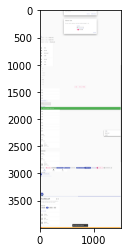

In [54]:
class JDIDatasetBuilder(DatasetBuilder):

    def setUp(self, driver):
        self.logger.info(f'getting page')
        driver.get(SITE_URL)
        #driver.set_window_size(width=1920, height=8400)
        driver.set_window_size(width=1500, height=4000)
        
#         driver.find_element_by_id("user-icon").click()
#         driver.find_element_by_id("name").send_keys(LOGIN)
#         driver.find_element_by_id("password").send_keys(PASSWORD)
#         driver.find_element_by_id("login-button").click()
        sleep(WAIT_TIME_SECONDS)
        
#         driver.find_element_by_link_text("Service").click()
#         driver.find_element_by_link_text("Complex Table").click()
#         maximize_window(driver=driver)
        
with JDIDatasetBuilder(url=SITE_URL, dataset_name=DATASET_NAME, headless=True) as builder:
    elements_df1 = builder.dataset
    
    dataset_json1 = builder.dataset_json
    plt.imshow(plt.imread(f'dataset/images/{DATASET_NAME}.png'))
    

In [57]:
dataset = JDNDataset(datasets_list=['mui-site121', 'mui-site122'], rebalance_and_shuffle=False)

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1329 [00:00<?, ?it/s]

  0%|          | 0/1326 [00:00<?, ?it/s]

2021-08-24 12:02:00,994 -INFO - 2600153284:2600153284.py:44 - self.df.shape: (2655, 28)
2021-08-24 12:02:00,995 -INFO - 2600153284:2600153284.py:46 - Check for duplicates...
2021-08-24 12:02:00,998 -INFO - 2600153284:2600153284.py:50 - Check for duplicates is OK
2021-08-24 12:02:01,021 -INFO - 1238942435:1238942435.py:6 - used column: tag_name
2021-08-24 12:02:01,023 -INFO - 1238942435:1238942435.py:9 - loading model/ohe_tag_name.pkl
2021-08-24 12:02:01,027 -INFO - 1238942435:1238942435.py:6 - used column: tag_name_parent
2021-08-24 12:02:01,028 -INFO - 1238942435:1238942435.py:9 - loading model/ohe_tag_name.pkl
2021-08-24 12:02:01,034 -INFO - 1238942435:1238942435.py:6 - used column: tag_name_upsib
2021-08-24 12:02:01,035 -INFO - 1238942435:1238942435.py:9 - loading model/ohe_tag_name.pkl
2021-08-24 12:02:01,039 -INFO - 1238942435:1238942435.py:6 - used column: tag_name_dnsib
2021-08-24 12:02:01,040 -INFO - 1238942435:1238942435.py:9 - loading model/ohe_tag_name.pkl
2021-08-24 12:02:0

  0%|          | 0/2655 [00:00<?, ?it/s]

2021-08-24 12:02:01,269 -INFO - 131696726:131696726.py:9 - used column: attributes_parent


  0%|          | 0/2655 [00:00<?, ?it/s]

2021-08-24 12:02:01,478 -INFO - 131696726:131696726.py:9 - used column: attributes_upsib


  0%|          | 0/2655 [00:00<?, ?it/s]

2021-08-24 12:02:01,670 -INFO - 131696726:131696726.py:9 - used column: attributes_dnsib


  0%|          | 0/2655 [00:00<?, ?it/s]

2021-08-24 12:02:01,878 -INFO - 1199642344:1199642344.py:41 - attributes_sm: (2655, 74)
2021-08-24 12:02:01,879 -INFO - 2973949930:2973949930.py:8 - used column: attributes
2021-08-24 12:02:01,880 -INFO - 2973949930:2973949930.py:11 - TfIdfVectorizer for class attribute exists. Loaging...
2021-08-24 12:02:01,896 -INFO - 2973949930:2973949930.py:8 - used column: attributes_parent
2021-08-24 12:02:01,897 -INFO - 2973949930:2973949930.py:11 - TfIdfVectorizer for class attribute exists. Loaging...
2021-08-24 12:02:01,916 -INFO - 2973949930:2973949930.py:8 - used column: attributes_upsib
2021-08-24 12:02:01,917 -INFO - 2973949930:2973949930.py:11 - TfIdfVectorizer for class attribute exists. Loaging...
2021-08-24 12:02:01,928 -INFO - 2973949930:2973949930.py:8 - used column: attributes_dnsib
2021-08-24 12:02:01,929 -INFO - 2973949930:2973949930.py:11 - TfIdfVectorizer for class attribute exists. Loaging...
2021-08-24 12:02:01,941 -INFO - 1199642344:1199642344.py:48 - class_sm: (2655, 148)
2

In [58]:
model = torch.load('model/model.pth', map_location='cpu').to(DEVICE)
model.eval()
with torch.no_grad():

    dataloader = DataLoader(dataset, shuffle=False, batch_size=1, pin_memory=True)
    results = []

    with trange(len(dataloader), desc='Evaluating:') as bar:
        with torch.no_grad():
            for x, y in dataloader:
                y_pred = torch.round(torch.nn.Softmax(dim=1)(model(x.to(DEVICE)).to('cpu'))).detach().numpy()
                y_pred = y_pred[0].argmax()
                y = y.item()

                results.append({
                    'y_true': y,
                    'y_pred': y_pred,
                    'y_true_label': dataset.classes_reverse_dict[y],
                    'y_pred_label': dataset.classes_reverse_dict[y_pred]
                })
                bar.update(1)

results_df = pd.DataFrame(results)
results_df['is_hidden'] = dataset.df.is_hidden.values

Evaluating::   0%|          | 0/2655 [00:00<?, ?it/s]

In [67]:
results_df

,y_true,y_pred,y_true_label,y_pred_label,is_hidden
0,0,0,n/a,n/a,0
1,0,0,n/a,n/a,0
2,0,0,n/a,n/a,0
3,0,0,n/a,n/a,0
4,0,0,n/a,n/a,0
...,...,...,...,...,...
2650,0,0,n/a,n/a,0
2651,0,0,n/a,n/a,0
2652,0,0,n/a,n/a,0
2653,35,35,divider,divider,0


In [64]:
results_df[results_df['y_true_label'] != 'n/a']

,y_true,y_pred,y_true_label,y_pred_label,is_hidden
11,12,12,button,button,0
25,2,2,icon,icon,0
27,22,22,chip,chip,0
33,15,15,typography,typography,0
36,15,15,typography,typography,0
...,...,...,...,...,...
2609,12,12,button,button,0
2615,15,15,typography,typography,0
2617,35,35,divider,divider,0
2641,30,30,grid,grid,0


In [71]:
accuracy(results_df)

2021-08-24 12:38:45,428 -INFO - 351379934:351379934.py:18 - Accuracy:  414/424 = 0.9764150943396226, for 2655 elements


0.9764150943396226

In [66]:
results_df[results_df['y_true_label'] != results_df['y_pred_label'] ]

,y_true,y_pred,y_true_label,y_pred_label,is_hidden
49,0,15,n/a,typography,0
75,0,15,n/a,typography,0
244,0,15,n/a,typography,0
340,0,12,n/a,button,0
530,0,15,n/a,typography,0
596,0,19,n/a,breadcrumbs,0
616,2,0,icon,n/a,0
684,0,15,n/a,typography,0
974,2,0,icon,n/a,0
1141,0,15,n/a,typography,0


In [74]:
from sklearn.metrics import accuracy_score

In [75]:
accuracy_score(results_df['y_true'],results_df['y_pred'])

0.9962335216572504